<img src = "https://raw.githubusercontent.com/jaymalak/jaymala.kanagala-gmail.com-Term1-2-EDA-Project/master/Images/KCCA.png" width="140" height="560">

# EDA on KAMPALA CITY AUTHORITY's(KCCA) PROPERTY DATA

## Table of Contents

1. [**Problem Statement**](#section1)<br>
  - 1.1 [Introduction](#section101)<br>
  - 1.2 [DataSource and DataSet](#section102)<br><br>
2. [Importing Packages](#section2)<br><br>
3. [**Loading Data**](#section3)<br>
  - 3.1 [Importing Two Datasets](#section301)<br>
  - 3.2 [Description of the Dataset I](#section302)<br>
  - 3.3 [Description of the Dataset II](#section303)<br>
  - 3.4 [Pandas Profiling before Data Preprocessing](#section304)<br>
  - 3.5 [Merging ofTwo Datasets for easier EDA](#section305)<br>
  - 3.6 [Pandas Profiling Before Data Processing on Merged DataSets ](#section306)<br><br>
4. [**Data Preprocessing**](#section4)<br>
  - 4.1 [**Data Preprocessing**](#section401)<br>
  - 4.2 [**Pandas Profiling after Data Preprocessing**](#section402)<br><br>
5. [**Exploratory Data Analysis**](#section5)<br>
  - 5.1 [**Analysis based on Perish**](#section501)<br>
    - 5.1.1 [Which Perish has Maximum number of Properties?](#section50101)<br>
    - 5.1.2 [Which Perish generate maximum revenue for KCCA?](#section50102)<br><br>
  - 5.2 [**Analysis based on Village**](#section502)<br>
      - 5.2.1 [Which Villages has Maximum number of Properties?](#section50201)<br>
      - 5.2.2 [Which Village generates Maximum Revenue for KCCA?](#section50202)<br><br>
  - 5.3 [**Analysis based on Property Usage**](#section503)<br>
    - 5.3.1 [Property Usage wise Count of Properties (Perish and Village wise)](#section50301)<br>
    - 5.3.2 [Property Usage wise Revenue Generated for KCCA](#section50302)<br>
    - 5.3.3 [Top 10 combination of Perish -Village -Usage, which generates Highest Revenue for KCCA](#section50303)<br>
    - 5.3.4 [Perish and Usage wise Property Tax Analysis](#section50304)<br><br>    
  - 5.4 [**Analysis of Mismatch Data**](#section504)<br>
    - 5.4.1 [Perish wise count of mismatched Property Data](#section50401)<br><br>
  - 5.5 [**Analysis on the basis of Higest Property Tax**](#section505)<br>
    - 5.5.1 [Top 10 Property Tax Payers](#section50501)<br>
    - 5.5.2 [Perish wise Revenue from Top 10 Properties](#section50502)<br>
    - 5.5.3 [Usage wise Revenue from Top 10 Properties ](#section50503)<br>
    - 5.5.4 [Analyis of Top 10 Properties on the basis of Carpet Area of Property](#section50504)<br><br>
  6. [**Conclusion**](#section6)
      - 6.1 [**Actionable Insights**](#section601)

<a id=section1></a>
### 1.	Problem Statement
          a.	To check Quality of Data collected During Survey
          b.	How Various factors defined during Survey impacting the valuation of Property under Survey in same area?
          c.	Disparity in the Property Valaution method

<a id=section101></a>
### 1.1.	Introduction
  
  Kampala City Authority, Uganda (KCCA) Completed Property Survey, in order to complete the valuation of all properties under them. Property Tax is levied by them on Valuation amount. Property tax is one of the major Revenue head for them.
Here I  reviewed and analyzed samples of assessed/valued properties in Central Division and used this data (Property attributes and Ratable Values).

During the data collection process, about 14-16 attributes/Factors are captured on each and every property. These attributes can be broadly categorized as details on; Ownership, property location, Usage, Building, Construction, Accommodation and others. It should be noted that although comprehensive data is collected on every property, not all this data is used to make assessments for property Values. Some data is needed/used for administrative purposes for example ownership details. 

The purpose of this data analysis is to check Quality of data collected and impact of attributes/ factors on earlier valuation value by KCCA. 

Further to this analysis KCCA want to derive model to calculate Valuation (ALV / RV) with the useful Attributes / Factors

Attributes considered / collected during Survey are

        1. Total Built Up Area
        2. Type of Access
        3. Neighborhood status
        4. Building condition
        5. Availability of NWSC
        6. Availability of Hydro Power
        7. Type of walls
        8. Type of floor finish
        9. Type of sanitation facility
        10. Availability of Parking space
        11. Security measure
        12. Type of boundary wall
        13. Type of wall finishes
        14. Type of ceiling
        15. Ownership 
        16. Usage of the Property


<a id=section102></a>  
### 1.2.	Data Source and Dataset

    Data collected by KCCA during property Survey done during year 2017-18. 

    Sample data of one Division is taken for analysis out of 5 division.

<a id=section2></a>
###  2.  Importing Packages 

In [1]:
import sys                                                                      # Import packages
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import pie, axis, show
%matplotlib inline                                                              

import warnings                                                                 # Ignore warning related to pandas_profiling
warnings.filterwarnings('ignore') 
pd.set_option('display.max_columns', 100)                                       # Display all dataframe columns in outputs 

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(style='whitegrid', font_scale=1.3, color_codes=True)      # To apply seaborn styles to the plots.

In [3]:
# Making plotly specific imports
# These imports are necessary to use plotly offline without signing in to their website.

from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly import tools
init_notebook_mode(connected=True)

In [4]:
# Install chart_studio

!pip install chart-studio

<a id=section3></a>
### 3. Loading Data

       For Data Visualisation here we are using 2 dataset of KCCA - Property Valuation.
            
         1. Property Master Data - This Dataset contains details about property Ownership details, Property Physical address along with its Latitutde and Longitude details
            
         2. Property Valuation Data - This Dataset contains details about property details which has impact on Valuation and on Revenue of KCCA

<a id=section301></a>
### 3.1  Importing Two Datasets

#### Importing 1st Dataset - for Proeprty Details (Ownerhip, Area, Location Details)

In [5]:
pm = pd.read_csv("https://raw.githubusercontent.com/jaymalak/jaymala.kanagala-gmail.com-Term1-2-EDA-Project/master/DATA/Propmst.csv")

#### Importing 2nd Dataset - for Property Valuation Details - Carpet Area, Factors affecting valuation and Proeprty Tax(Revenue)

In [6]:
pv = pd.read_csv("https://raw.githubusercontent.com/jaymalak/jaymala.kanagala-gmail.com-Term1-2-EDA-Project/master/DATA/propval.csv")

In [7]:
pm.dtypes

Property No.               object
CAMV_ID                     int64
Property is Legal          object
House No                   object
House / Apartment Name     object
Street / Road              object
Area / Locality            object
Division                   object
Perish                     object
Village                    object
Property Org Name          object
Owner Fname                object
Owner Mname                object
Owner Lname                object
Title                      object
Contact No                  int64
Mobile No                 float64
Email Id                   object
COIN                        int64
Property Address           object
Plot Area                   int64
Plot No                    object
Property Type              object
Property SubType           object
Latitude                  float64
Longitude                 float64
Frontage                   object
dtype: object

In [8]:
pv.dtypes

Property No.                           object
Type of Access (X2)                    object
Neighbourhood Status (X3)              object
Building Condition (X4)                object
Type of Walls (X5)                     object
Type of Wall finish (X6)               object
Type of Floor Finish (X7)              object
Type of Ceiling (X8)                   object
NWSC Availabilty (X9)                  object
Hydro Power Availabilty (X10)          object
Type of Saniation Facility (X11)       object
Availabilty of Parking Space (X12)     object
Type of Security (X13)                 object
Type of Boundary Wall (X14)            object
Occupency Type                         object
Carpet Area                           float64
Usage Type                             object
Usage SubType                          object
ALV                                   float64
RV                                    float64
Property Tax                          float64
Avg. Property Rate (per SQM)      

In [9]:
pm.head()

,Property No.,CAMV_ID,Property is Legal,House No,House / Apartment Name,Street / Road,Area / Locality,Division,Perish,Village,Property Org Name,Owner Fname,Owner Mname,Owner Lname,Title,Contact No,Mobile No,Email Id,COIN,Property Address,Plot Area,Plot No,Property Type,Property SubType,Latitude,Longitude,Frontage
0,P117000004,1404,Yes,61A SIXTH STREET,STAUNCH GENERATORS,SIXTH STREET,SIXTH STREET,CENTRAL,INDUSTRIAL AREA,Sixth Street Zone,NADIM'S LTD,NaN,NaN,NaN,Other,752251144,NaN,PROPERTY@DMAIL.UG,12877721,1707 KAMPALA,0,137-145,INDUSTRIAL,Showroom,455922.5183,35301.91330,SIXTH STREET
1,P117000005,351,Yes,2A Nakasero Lane,D MELLOS BAR AND RESTAURANT,NAKASERO LANE,Nakasero Lane,CENTRAL,NAKASERO II,Flats Villages Zone,NAKASERO CLUB LIMITED,NaN,NaN,NaN,Other,772736444,NaN,PRIAMITTYRES@GMAIL.COM,12942420,3446 KAMPALA,0,10-Dec,COMMERCIAL,Restaurant,452739.6344,35770.36563,Nakasero Lane
2,P117000006,23596,Yes,13 BUGANDA ROAD,SENANA HYPERMARKET,BUGANDA ROAD,BUGANDA ROAD,CENTRAL,NAKASERO II,Flats Villages Zone,FARIDA NABIRONGO c/o SENANA SHOPING CENTRE,NaN,NaN,NaN,Mrs,702658026,NaN,NaN,13335561,13 BUGANDA ROAD,0,21-27,COMMERCIAL,Retail_Space,452682.8282,35578.36563,BUGANDA ROAD
3,P117000162,16246,Yes,29 WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,CENTRAL,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,NaN,NaN,NaN,Other,772748379,NaN,TOMKITANDWE@MARIANAAGENCIES.COM,18317287,"12016, KAMPALA",0,29,COMMERCIAL,Retail_Space_Rear_Room,452532.0427,35319.33439,WILLIAM STREET
4,P117000164,2028,Yes,33A WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,CENTRAL,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,NaN,NaN,NaN,Other,772748379,NaN,TOMKITANDWE@MARIANAAGENCIES.COM,18317287,"12016, KAMPALA",0,33,COMMERCIAL,Retail_Space_Office_Space,452495.6146,35371.68855,WILLIAM STREET


In [10]:
pm.shape

(7924, 27)

In [11]:
pm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7924 entries, 0 to 7923
Data columns (total 27 columns):
Property No.              7924 non-null object
CAMV_ID                   7924 non-null int64
Property is Legal         7924 non-null object
House No                  7924 non-null object
House / Apartment Name    7924 non-null object
Street / Road             7924 non-null object
Area / Locality           7924 non-null object
Division                  7924 non-null object
Perish                    7924 non-null object
Village                   7924 non-null object
Property Org Name         2325 non-null object
Owner Fname               4997 non-null object
Owner Mname               17 non-null object
Owner Lname               5609 non-null object
Title                     7924 non-null object
Contact No                7924 non-null int64
Mobile No                 1649 non-null float64
Email Id                  2969 non-null object
COIN                      7924 non-null int64
Prop

<a id=section302></a>
#### 3.2  Description of Dataset I

       . This Data set contains total 27 Columns and total 7924 Property details (row)
       . There are 7 Numeric and 20 columns with Object type
       . There are missing values under following coloumn
               1. Prop_org_name
               2. Owner first, last and middle name
               3. Mobile Number
               4. Email IDs
             

In [12]:
pv.head()

,Property No.,Type of Access (X2),Neighbourhood Status (X3),Building Condition (X4),Type of Walls (X5),Type of Wall finish (X6),Type of Floor Finish (X7),Type of Ceiling (X8),NWSC Availabilty (X9),Hydro Power Availabilty (X10),Type of Saniation Facility (X11),Availabilty of Parking Space (X12),Type of Security (X13),Type of Boundary Wall (X14),Occupency Type,Carpet Area,Usage Type,Usage SubType,ALV,RV,Property Tax,Avg. Property Rate (per SQM)
0,P117000004,Main Road,HIGH CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,CCTV,WALL,RENTED,372.94,INDUSTRIAL,Showroom,1.643323e+07,1.150326e+07,690195.60,1850.69
1,P117000005,Main Road,HIGH CLASS,FAIR,METALLIC SHEETING,PAINTED,CERAMIC TILES,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,250.99,COMMERCIAL,Restaurant,2.527914e+07,1.769540e+07,1061723.82,4230.14
2,P117000006,Main Road,MIDDLE CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,NONE,NONE,RENTED,23365.00,COMMERCIAL,Retail_Space,2.140321e+09,1.498224e+09,89893468.20,3847.36
3,P117000162,Main Road,HIGH CLASS,POOR,BRICKS,PAINTED,CEMENT SCREED,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,SECURITY GUARD,NONE,RENTED,737.00,COMMERCIAL,Retail_Space_Rear_Room,7.577539e+07,5.304277e+07,3182566.44,4318.27
4,P117000164,Main Road,HIGH CLASS,FAIR,BRICKS,PLASTERED,CEMENT SCREED,PLASTERED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,NONE,RENTED,832.95,COMMERCIAL,Retail_Space_Office_Space,1.509816e+08,1.056871e+08,6341228.22,7612.98


In [13]:
pv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7924 entries, 0 to 7923
Data columns (total 22 columns):
Property No.                          7924 non-null object
Type of Access (X2)                   7924 non-null object
Neighbourhood Status (X3)             7924 non-null object
Building Condition (X4)               7924 non-null object
Type of Walls (X5)                    7924 non-null object
Type of Wall finish (X6)              7924 non-null object
Type of Floor Finish (X7)             7924 non-null object
Type of Ceiling (X8)                  7924 non-null object
NWSC Availabilty (X9)                 7924 non-null object
Hydro Power Availabilty (X10)         7924 non-null object
Type of Saniation Facility (X11)      7924 non-null object
Availabilty of Parking Space (X12)    7924 non-null object
Type of Security (X13)                7924 non-null object
Type of Boundary Wall (X14)           7924 non-null object
Occupency Type                        7924 non-null object
Carpet A

In [14]:
pv.shape

(7924, 22)

<a id=section303></a>
#### 3.3  Description of Dataset II

. This Data set contains total 22 Columns and total 7924 Property details (row)
       . There are 5 Numeric and 18 columns with Object type
       . There are no missing values 

In [15]:
pm.describe(include = 'all')                 

,Property No.,CAMV_ID,Property is Legal,House No,House / Apartment Name,Street / Road,Area / Locality,Division,Perish,Village,Property Org Name,Owner Fname,Owner Mname,Owner Lname,Title,Contact No,Mobile No,Email Id,COIN,Property Address,Plot Area,Plot No,Property Type,Property SubType,Latitude,Longitude,Frontage
count,7924,7924.000000,7924,7924,7924,7924,7924,7924,7924,7924,2325,4997,17,5609,7924,7.924000e+03,1.649000e+03,2969,7.924000e+03,7924,7924.0,7924,7924,7924,7924.000000,7924.000000,7924
unique,7924,NaN,1,7924,955,114,383,1,21,128,747,1005,8,1944,7,NaN,NaN,988,NaN,5893,NaN,1340,5,48,NaN,NaN,383
top,P117002998,NaN,Yes,11A Market Street,-,Unknown,Kisenyi II Zone,CENTRAL,KAMWOKYA II,Church Zone,KAMPALA CAPITAL CITY AUTHORITY,JOHN,MAYI,LUBEGA,Mr,NaN,NaN,INFO@UGANDAPOLICE.GO.UG,NaN,7010 KAMPALA,NaN,0,RESIDENTIALRENTED,TenementMuzigo,NaN,NaN,Kisenyi II Zone
freq,1,NaN,7924,1,6047,3744,256,7924,1489,464,119,179,4,52,3904,NaN,NaN,94,NaN,91,NaN,1821,3428,2549,NaN,NaN,256
mean,NaN,8647.751136,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.009072e+08,7.057148e+08,NaN,1.303669e+07,NaN,0.0,NaN,NaN,NaN,453118.262825,36030.209305,NaN
std,NaN,5980.333632,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.393335e+08,1.234957e+08,NaN,1.442856e+06,NaN,0.0,NaN,NaN,NaN,1328.263020,1534.679979,NaN
min,NaN,126.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.046600e+08,2.046600e+07,NaN,1.458960e+05,NaN,0.0,NaN,NaN,NaN,451053.190000,33619.587500,NaN
25%,NaN,3956.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.043314e+08,7.025651e+08,NaN,1.285677e+07,NaN,0.0,NaN,NaN,NaN,451954.393175,34678.309375,NaN
50%,NaN,7608.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.721223e+08,7.527357e+08,NaN,1.301294e+07,NaN,0.0,NaN,NaN,NaN,452724.000000,35835.936245,NaN
75%,NaN,11660.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.727804e+08,7.725111e+08,NaN,1.346130e+07,NaN,0.0,NaN,NaN,NaN,454139.614975,37406.609982,NaN


In [16]:
pv.describe(include= 'all')

,Property No.,Type of Access (X2),Neighbourhood Status (X3),Building Condition (X4),Type of Walls (X5),Type of Wall finish (X6),Type of Floor Finish (X7),Type of Ceiling (X8),NWSC Availabilty (X9),Hydro Power Availabilty (X10),Type of Saniation Facility (X11),Availabilty of Parking Space (X12),Type of Security (X13),Type of Boundary Wall (X14),Occupency Type,Carpet Area,Usage Type,Usage SubType,ALV,RV,Property Tax,Avg. Property Rate (per SQM)
count,7924,7924,7924,7924,7924,7924,7924,7924,7924,7924,7924,7924,7924,7924,7924,7924.000000,7924,7924,7.924000e+03,7.924000e+03,7.924000e+03,7924.000000
unique,7924,4,3,6,5,6,8,7,2,2,3,2,6,8,1,NaN,5,48,NaN,NaN,NaN,NaN
top,P117002998,Main Road,SLUM,FAIR,BRICKS,PAINTED,CEMENT SCREED,NONE,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,NONE,WALL,RENTED,NaN,RESIDENTIALRENTED,TenementMuzigo,NaN,NaN,NaN,NaN
freq,1,4498,3475,5169,6834,4201,4994,3382,6759,7870,3677,4304,4678,3803,7924,NaN,3428,2549,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,451.200632,NaN,NaN,4.198366e+07,2.959009e+07,1.775405e+06,3623.458523
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1454.366436,NaN,NaN,1.711208e+08,1.197229e+08,7.183376e+06,3771.374562
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.440000,NaN,NaN,5.243571e+04,3.670500e+04,2.202300e+03,8.890000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.930000,NaN,NaN,2.006976e+06,1.474200e+06,8.845200e+04,1907.225000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,83.655000,NaN,NaN,4.813714e+06,3.510000e+06,2.106000e+05,2878.705000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,234.671750,NaN,NaN,1.800000e+07,1.299269e+07,7.795614e+05,4297.960000


<a id=section304></a>
#### 3.4  Pandas Profiling before Data Processing 

In [17]:
import pandas_profiling                                                      # Get a quick overview for all the variables using pandas_profiling                                         
profilepm = pandas_profiling.ProfileReport(pm)
profilepm.to_file(output_file="D:\Jaymala\P\Datascience\Project\jaymala.kanagala@gmail.com-TERM 1&2 EDA Project\Before DataProcessing Profiling output\out_pm.html") 
pm.profile_report(title='Pandas Profiling before Data Preprocessing', style={'full_width':True})

In [18]:
import pandas_profiling                                                      # Get a quick overview for all the variables using pandas_profiling                                         
profilepv = pandas_profiling.ProfileReport(pv)
profilepv.to_file(output_file="D:\Jaymala\P\Datascience\Project\jaymala.kanagala@gmail.com-TERM 1&2 EDA Project\Before DataProcessing Profiling output\out_pv.html")
pv.profile_report(title='Pandas Profiling before Data Preprocessing', style={'full_width':True})

In [19]:
pv_rd = pv.round(decimals=3)
pv_rd.head()

,Property_No._,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Occupency_Type_,Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV,Property_Tax,Avg._Property_Rate_(per_SQM)
0,P117000004,Main Road,HIGH CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,CCTV,WALL,RENTED,372.94,INDUSTRIAL,Showroom,1.643323e+07,1.150326e+07,690195.60,1850.69
1,P117000005,Main Road,HIGH CLASS,FAIR,METALLIC SHEETING,PAINTED,CERAMIC TILES,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,250.99,COMMERCIAL,Restaurant,2.527914e+07,1.769540e+07,1061723.82,4230.14
2,P117000006,Main Road,MIDDLE CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,NONE,NONE,RENTED,23365.00,COMMERCIAL,Retail_Space,2.140321e+09,1.498224e+09,89893468.20,3847.36
3,P117000162,Main Road,HIGH CLASS,POOR,BRICKS,PAINTED,CEMENT SCREED,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,SECURITY GUARD,NONE,RENTED,737.00,COMMERCIAL,Retail_Space_Rear_Room,7.577539e+07,5.304277e+07,3182566.44,4318.27
4,P117000164,Main Road,HIGH CLASS,FAIR,BRICKS,PLASTERED,CEMENT SCREED,PLASTERED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,NONE,RENTED,832.95,COMMERCIAL,Retail_Space_Office_Space,1.509816e+08,1.056871e+08,6341228.22,7612.98


In [20]:
pm['Perish'].value_counts()                                            ### Perish wise Count of Properties

KAMWOKYA II            1489
MENGO                  1028
KISENYI II              759
BUKESA                  667
KAGUGUBE                534
INDUSTRIAL AREA         469
NAKASERO II             385
OLD KAMPALA             322
KAMWOKYA I              319
CIVIC CENTER            269
KOLOLO IV               237
KISENYI  III            234
KOLOLO I                222
NAKASERO IV             193
KISENYI I               180
KOLOLO III              158
KOLOLO II               144
NAKASERO I              123
NAKIVUBO-SHAURIYAKO     121
NAKASERO III             69
Kisenyi  III              2
Name: Perish, dtype: int64

In [21]:
pm.groupby(['Perish','Village'])['Village'].count()

Perish               Village                    
BUKESA               Church Zone                     93
                     Jambula Zone                    41
                     Kakajo I Zone                   89
                     Kakajo II Zone                  87
                     Katende Zone                   126
                     Kiyindi Zone                    41
                     Namalwa I Zone                 106
                     Namalwa II Zone                 72
                     Nsalo Zone                      12
CIVIC CENTER         Christ The King Zone            54
                     Neeta Zone                      44
                     Nkurumah Zone                  106
                     Radio Uganda Zone               65
INDUSTRIAL AREA      Pepsi Cola Zone                210
                     Seventh Street Zone            142
                     Sixth Street Zone              117
KAGUGUBE             Industrial Zone                112

Text(0.5, 1.0, 'Pie chart showing the proportion of each Perish value')

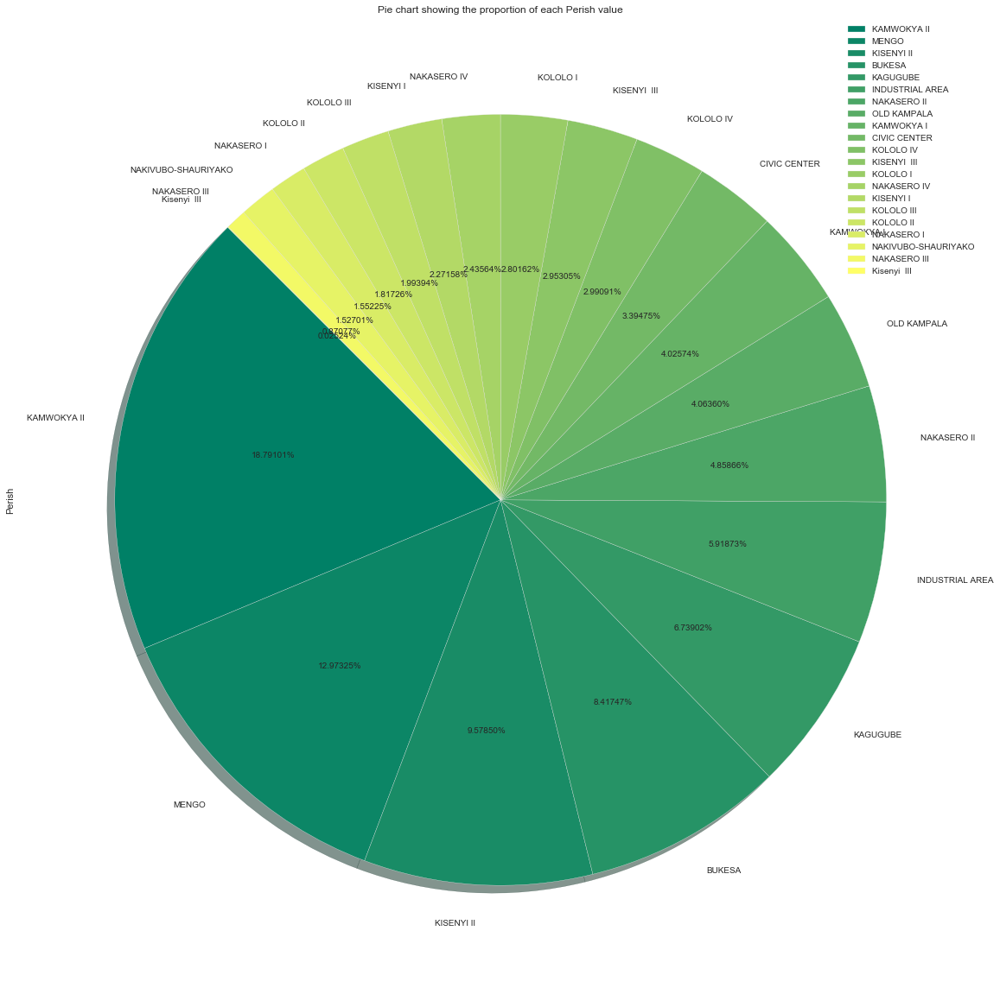

In [22]:
pm['Perish'].value_counts().plot(kind='pie',fontsize=10, autopct='%1.5f%%',figsize=(20,30), shadow=True, startangle=135, legend=True, cmap='summer')
plt.ylabel('Perish')
plt.title('Pie chart showing the proportion of each Perish value')

<a id=section305></a>
####  3.5 Merging Two Datasets, for easier EDA

In [23]:
prop_merge = pd.merge(pm, pv, how='inner', left_on='Property_No._', right_on='Property_No._').drop(['CAMV_ID'], 1)
prop_merge.head()

,Property_No._,Property_is_Legal,House_No,House_/_Apartment_Name,Street_/_Road,Area_/_Locality,Division,Perish,Village,Property_Org_Name,Owner_Fname,Owner_Mname,Owner_Lname,Title,Contact_No,Mobile_No,Email_Id,COIN,Property_Address,Plot_Area,Plot_No,Property_Type,Property_SubType,Latitude,Longitude,Frontage,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Occupency_Type_,Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV,Property_Tax,Avg._Property_Rate_(per_SQM)
0,P117000004,Yes,61A SIXTH STREET,STAUNCH GENERATORS,SIXTH STREET,SIXTH STREET,CENTRAL,INDUSTRIAL AREA,Sixth Street Zone,NADIM'S LTD,NaN,NaN,NaN,Other,752251144,NaN,PROPERTY@DMAIL.UG,12877721,1707 KAMPALA,0,137-145,INDUSTRIAL,Showroom,455922.5183,35301.91330,SIXTH STREET,Main Road,HIGH CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,CCTV,WALL,RENTED,372.94,INDUSTRIAL,Showroom,1.643323e+07,1.150326e+07,690195.60,1850.69
1,P117000005,Yes,2A Nakasero Lane,D MELLOS BAR AND RESTAURANT,NAKASERO LANE,Nakasero Lane,CENTRAL,NAKASERO II,Flats Villages Zone,NAKASERO CLUB LIMITED,NaN,NaN,NaN,Other,772736444,NaN,PRIAMITTYRES@GMAIL.COM,12942420,3446 KAMPALA,0,10-Dec,COMMERCIAL,Restaurant,452739.6344,35770.36563,Nakasero Lane,Main Road,HIGH CLASS,FAIR,METALLIC SHEETING,PAINTED,CERAMIC TILES,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,250.99,COMMERCIAL,Restaurant,2.527914e+07,1.769540e+07,1061723.82,4230.14
2,P117000006,Yes,13 BUGANDA ROAD,SENANA HYPERMARKET,BUGANDA ROAD,BUGANDA ROAD,CENTRAL,NAKASERO II,Flats Villages Zone,FARIDA NABIRONGO c/o SENANA SHOPING CENTRE,NaN,NaN,NaN,Mrs,702658026,NaN,NaN,13335561,13 BUGANDA ROAD,0,21-27,COMMERCIAL,Retail_Space,452682.8282,35578.36563,BUGANDA ROAD,Main Road,MIDDLE CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,NONE,NONE,RENTED,23365.00,COMMERCIAL,Retail_Space,2.140321e+09,1.498224e+09,89893468.20,3847.36
3,P117000162,Yes,29 WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,CENTRAL,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,NaN,NaN,NaN,Other,772748379,NaN,TOMKITANDWE@MARIANAAGENCIES.COM,18317287,"12016, KAMPALA",0,29,COMMERCIAL,Retail_Space_Rear_Room,452532.0427,35319.33439,WILLIAM STREET,Main Road,HIGH CLASS,POOR,BRICKS,PAINTED,CEMENT SCREED,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,SECURITY GUARD,NONE,RENTED,737.00,COMMERCIAL,Retail_Space_Rear_Room,7.577539e+07,5.304277e+07,3182566.44,4318.27
4,P117000164,Yes,33A WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,CENTRAL,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,NaN,NaN,NaN,Other,772748379,NaN,TOMKITANDWE@MARIANAAGENCIES.COM,18317287,"12016, KAMPALA",0,33,COMMERCIAL,Retail_Space_Office_Space,452495.6146,35371.68855,WILLIAM STREET,Main Road,HIGH CLASS,FAIR,BRICKS,PLASTERED,CEMENT SCREED,PLASTERED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,NONE,RENTED,832.95,COMMERCIAL,Retail_Space_Office_Space,1.509816e+08,1.056871e+08,6341228.22,7612.98


In [24]:
prop_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7924 entries, 0 to 7923
Data columns (total 47 columns):
Property_No._                         7924 non-null object
Property_is_Legal                     7924 non-null object
House_No                              7924 non-null object
House_/_Apartment_Name                7924 non-null object
Street_/_Road                         7924 non-null object
Area_/_Locality                       7924 non-null object
Division                              7924 non-null object
Perish                                7924 non-null object
Village                               7924 non-null object
Property_Org_Name                     2325 non-null object
Owner_Fname                           4997 non-null object
Owner_Mname                           17 non-null object
Owner_Lname                           5609 non-null object
Title                                 7924 non-null object
Contact_No                            7924 non-null int64
Mobile_No  

#### After merging two datasets, New Dataframe prop_merge created. New Dataframe prop_merge has
    1. total 47 Columns
    2. Eleven Columns are Numeric and 36 columns are of Object type
    3. Missing Values are in Prop_ORG_name, Owner's First, middle and last name, Mobile Number, Email 

In [25]:
prop_merge.describe()

,Contact_No,Mobile_No,COIN,Plot_Area,Latitude,Longitude,Carpet_Area_,ALV,RV,Property_Tax,Avg._Property_Rate_(per_SQM)
count,7.924000e+03,1.649000e+03,7.924000e+03,7924.0,7924.000000,7924.000000,7924.000000,7.924000e+03,7.924000e+03,7.924000e+03,7924.000000
mean,7.009072e+08,7.057148e+08,1.303669e+07,0.0,453118.262825,36030.209305,451.200632,4.198366e+07,2.959009e+07,1.775405e+06,3623.458523
std,1.393335e+08,1.234957e+08,1.442856e+06,0.0,1328.263020,1534.679979,1454.366436,1.711208e+08,1.197229e+08,7.183376e+06,3771.374562
min,2.046600e+08,2.046600e+07,1.458960e+05,0.0,451053.190000,33619.587500,1.440000,5.243571e+04,3.670500e+04,2.202300e+03,8.890000
25%,7.043314e+08,7.025651e+08,1.285677e+07,0.0,451954.393175,34678.309375,36.930000,2.006976e+06,1.474200e+06,8.845200e+04,1907.225000
50%,7.721223e+08,7.527357e+08,1.301294e+07,0.0,452724.000000,35835.936245,83.655000,4.813714e+06,3.510000e+06,2.106000e+05,2878.705000
75%,7.727804e+08,7.725111e+08,1.346130e+07,0.0,454139.614975,37406.609982,234.671750,1.800000e+07,1.299269e+07,7.795614e+05,4297.960000
max,9.510807e+08,7.949330e+08,2.068254e+07,0.0,456718.868300,38772.743230,37123.300000,5.933817e+09,4.153672e+09,2.492203e+08,90293.670000


In [26]:
prop_merge.shape

(7924, 47)

<a id=section306></a>
### 3.6 Pandas Profiling Before Data Processing on Merged DataSet

In [27]:
import pandas_profiling

In [28]:
befprof = prop_merge.profile_report(title='Pandas Profiling before Data Preprocessing')
befprof.to_file(output_file="D:\Jaymala\P\Datascience\Project\jaymala.kanagala@gmail.com-TERM 1&2 EDA Project\Before DataProcessing Profiling output\profiling_before_preprocessing_onmerged.html")
prop_merge.profile_report(title='Pandas Profiling before Data Preprocessing', style={'full_width':True})

#### Observations from Pandas Profiling before Data Processing

##### DataSet Information 
    .  Number of Variables     -  47
    .  Number of Observations  - 7924
    .  Missing Cells           -  29978 (8.0%)
    
##### Variables Type

    . Numeric      8
    . Categorical  28
    . Boolean      1
    . Text         2
    . Rejected     8
    
##### Other Analysis
1. Occupancy Type has constant value
2. Property_Org_name has missing values. Need to check with Property Type, as if property is other than Residential then value must be there. Else Wrong Property in Property type and same need to rectify as same has impact on property valuation

<a id=section4></a>
## 4. Data Processing

<a id=section401></a>
### 4.1 Data Processing

In [29]:
prop_merge['Perish'].value_counts()

KAMWOKYA II            1489
MENGO                  1028
KISENYI II              759
BUKESA                  667
KAGUGUBE                534
INDUSTRIAL AREA         469
NAKASERO II             385
OLD KAMPALA             322
KAMWOKYA I              319
CIVIC CENTER            269
KOLOLO IV               237
KISENYI  III            234
KOLOLO I                222
NAKASERO IV             193
KISENYI I               180
KOLOLO III              158
KOLOLO II               144
NAKASERO I              123
NAKIVUBO-SHAURIYAKO     121
NAKASERO III             69
Kisenyi  III              2
Name: Perish, dtype: int64

#### Observation :Kisenyi  III, is repeated as data found in Lower and upper case

In [30]:
prop_merge.head()

,Property_No._,Property_is_Legal,House_No,House_/_Apartment_Name,Street_/_Road,Area_/_Locality,Division,Perish,Village,Property_Org_Name,Owner_Fname,Owner_Mname,Owner_Lname,Title,Contact_No,Mobile_No,Email_Id,COIN,Property_Address,Plot_Area,Plot_No,Property_Type,Property_SubType,Latitude,Longitude,Frontage,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Occupency_Type_,Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV,Property_Tax,Avg._Property_Rate_(per_SQM)
0,P117000004,Yes,61A SIXTH STREET,STAUNCH GENERATORS,SIXTH STREET,SIXTH STREET,CENTRAL,INDUSTRIAL AREA,Sixth Street Zone,NADIM'S LTD,NaN,NaN,NaN,Other,752251144,NaN,PROPERTY@DMAIL.UG,12877721,1707 KAMPALA,0,137-145,INDUSTRIAL,Showroom,455922.5183,35301.91330,SIXTH STREET,Main Road,HIGH CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,CCTV,WALL,RENTED,372.94,INDUSTRIAL,Showroom,1.643323e+07,1.150326e+07,690195.60,1850.69
1,P117000005,Yes,2A Nakasero Lane,D MELLOS BAR AND RESTAURANT,NAKASERO LANE,Nakasero Lane,CENTRAL,NAKASERO II,Flats Villages Zone,NAKASERO CLUB LIMITED,NaN,NaN,NaN,Other,772736444,NaN,PRIAMITTYRES@GMAIL.COM,12942420,3446 KAMPALA,0,10-Dec,COMMERCIAL,Restaurant,452739.6344,35770.36563,Nakasero Lane,Main Road,HIGH CLASS,FAIR,METALLIC SHEETING,PAINTED,CERAMIC TILES,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,250.99,COMMERCIAL,Restaurant,2.527914e+07,1.769540e+07,1061723.82,4230.14
2,P117000006,Yes,13 BUGANDA ROAD,SENANA HYPERMARKET,BUGANDA ROAD,BUGANDA ROAD,CENTRAL,NAKASERO II,Flats Villages Zone,FARIDA NABIRONGO c/o SENANA SHOPING CENTRE,NaN,NaN,NaN,Mrs,702658026,NaN,NaN,13335561,13 BUGANDA ROAD,0,21-27,COMMERCIAL,Retail_Space,452682.8282,35578.36563,BUGANDA ROAD,Main Road,MIDDLE CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,NONE,NONE,RENTED,23365.00,COMMERCIAL,Retail_Space,2.140321e+09,1.498224e+09,89893468.20,3847.36
3,P117000162,Yes,29 WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,CENTRAL,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,NaN,NaN,NaN,Other,772748379,NaN,TOMKITANDWE@MARIANAAGENCIES.COM,18317287,"12016, KAMPALA",0,29,COMMERCIAL,Retail_Space_Rear_Room,452532.0427,35319.33439,WILLIAM STREET,Main Road,HIGH CLASS,POOR,BRICKS,PAINTED,CEMENT SCREED,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,SECURITY GUARD,NONE,RENTED,737.00,COMMERCIAL,Retail_Space_Rear_Room,7.577539e+07,5.304277e+07,3182566.44,4318.27
4,P117000164,Yes,33A WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,CENTRAL,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,NaN,NaN,NaN,Other,772748379,NaN,TOMKITANDWE@MARIANAAGENCIES.COM,18317287,"12016, KAMPALA",0,33,COMMERCIAL,Retail_Space_Office_Space,452495.6146,35371.68855,WILLIAM STREET,Main Road,HIGH CLASS,FAIR,BRICKS,PLASTERED,CEMENT SCREED,PLASTERED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,NONE,RENTED,832.95,COMMERCIAL,Retail_Space_Office_Space,1.509816e+08,1.056871e+08,6341228.22,7612.98


##### Property_is_Legal, Division,Owner name (fname, Mname,lname,tutle), Plot area,Plot_no are constant and not require for analysis as per Problem statement

In [31]:
prop_merge.drop(['Property_is_Legal', 'Division', 'Owner_Fname','Owner_Mname','Owner_Lname', 'Title', 'Plot_Area','Plot_No'], 1, inplace=True)

In [32]:
prop_merge.head()

,Property_No._,House_No,House_/_Apartment_Name,Street_/_Road,Area_/_Locality,Perish,Village,Property_Org_Name,Contact_No,Mobile_No,Email_Id,COIN,Property_Address,Property_Type,Property_SubType,Latitude,Longitude,Frontage,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Occupency_Type_,Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV,Property_Tax,Avg._Property_Rate_(per_SQM)
0,P117000004,61A SIXTH STREET,STAUNCH GENERATORS,SIXTH STREET,SIXTH STREET,INDUSTRIAL AREA,Sixth Street Zone,NADIM'S LTD,752251144,NaN,PROPERTY@DMAIL.UG,12877721,1707 KAMPALA,INDUSTRIAL,Showroom,455922.5183,35301.91330,SIXTH STREET,Main Road,HIGH CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,CCTV,WALL,RENTED,372.94,INDUSTRIAL,Showroom,1.643323e+07,1.150326e+07,690195.60,1850.69
1,P117000005,2A Nakasero Lane,D MELLOS BAR AND RESTAURANT,NAKASERO LANE,Nakasero Lane,NAKASERO II,Flats Villages Zone,NAKASERO CLUB LIMITED,772736444,NaN,PRIAMITTYRES@GMAIL.COM,12942420,3446 KAMPALA,COMMERCIAL,Restaurant,452739.6344,35770.36563,Nakasero Lane,Main Road,HIGH CLASS,FAIR,METALLIC SHEETING,PAINTED,CERAMIC TILES,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,250.99,COMMERCIAL,Restaurant,2.527914e+07,1.769540e+07,1061723.82,4230.14
2,P117000006,13 BUGANDA ROAD,SENANA HYPERMARKET,BUGANDA ROAD,BUGANDA ROAD,NAKASERO II,Flats Villages Zone,FARIDA NABIRONGO c/o SENANA SHOPING CENTRE,702658026,NaN,NaN,13335561,13 BUGANDA ROAD,COMMERCIAL,Retail_Space,452682.8282,35578.36563,BUGANDA ROAD,Main Road,MIDDLE CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,NONE,NONE,RENTED,23365.00,COMMERCIAL,Retail_Space,2.140321e+09,1.498224e+09,89893468.20,3847.36
3,P117000162,29 WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,772748379,NaN,TOMKITANDWE@MARIANAAGENCIES.COM,18317287,"12016, KAMPALA",COMMERCIAL,Retail_Space_Rear_Room,452532.0427,35319.33439,WILLIAM STREET,Main Road,HIGH CLASS,POOR,BRICKS,PAINTED,CEMENT SCREED,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,SECURITY GUARD,NONE,RENTED,737.00,COMMERCIAL,Retail_Space_Rear_Room,7.577539e+07,5.304277e+07,3182566.44,4318.27
4,P117000164,33A WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,772748379,NaN,TOMKITANDWE@MARIANAAGENCIES.COM,18317287,"12016, KAMPALA",COMMERCIAL,Retail_Space_Office_Space,452495.6146,35371.68855,WILLIAM STREET,Main Road,HIGH CLASS,FAIR,BRICKS,PLASTERED,CEMENT SCREED,PLASTERED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,NONE,RENTED,832.95,COMMERCIAL,Retail_Space_Office_Space,1.509816e+08,1.056871e+08,6341228.22,7612.98


In [33]:
prop_merge.shape

(7924, 39)

In [34]:
prop_merge = prop_merge.round(decimals=0)
prop_merge.head()

,Property_No._,House_No,House_/_Apartment_Name,Street_/_Road,Area_/_Locality,Perish,Village,Property_Org_Name,Contact_No,Mobile_No,Email_Id,COIN,Property_Address,Property_Type,Property_SubType,Latitude,Longitude,Frontage,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Occupency_Type_,Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV,Property_Tax,Avg._Property_Rate_(per_SQM)
0,P117000004,61A SIXTH STREET,STAUNCH GENERATORS,SIXTH STREET,SIXTH STREET,INDUSTRIAL AREA,Sixth Street Zone,NADIM'S LTD,752251144,NaN,PROPERTY@DMAIL.UG,12877721,1707 KAMPALA,INDUSTRIAL,Showroom,455923.0,35302.0,SIXTH STREET,Main Road,HIGH CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,CCTV,WALL,RENTED,373.0,INDUSTRIAL,Showroom,1.643323e+07,1.150326e+07,690196.0,1851.0
1,P117000005,2A Nakasero Lane,D MELLOS BAR AND RESTAURANT,NAKASERO LANE,Nakasero Lane,NAKASERO II,Flats Villages Zone,NAKASERO CLUB LIMITED,772736444,NaN,PRIAMITTYRES@GMAIL.COM,12942420,3446 KAMPALA,COMMERCIAL,Restaurant,452740.0,35770.0,Nakasero Lane,Main Road,HIGH CLASS,FAIR,METALLIC SHEETING,PAINTED,CERAMIC TILES,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,251.0,COMMERCIAL,Restaurant,2.527914e+07,1.769540e+07,1061724.0,4230.0
2,P117000006,13 BUGANDA ROAD,SENANA HYPERMARKET,BUGANDA ROAD,BUGANDA ROAD,NAKASERO II,Flats Villages Zone,FARIDA NABIRONGO c/o SENANA SHOPING CENTRE,702658026,NaN,NaN,13335561,13 BUGANDA ROAD,COMMERCIAL,Retail_Space,452683.0,35578.0,BUGANDA ROAD,Main Road,MIDDLE CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,NONE,NONE,RENTED,23365.0,COMMERCIAL,Retail_Space,2.140321e+09,1.498224e+09,89893468.0,3847.0
3,P117000162,29 WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,772748379,NaN,TOMKITANDWE@MARIANAAGENCIES.COM,18317287,"12016, KAMPALA",COMMERCIAL,Retail_Space_Rear_Room,452532.0,35319.0,WILLIAM STREET,Main Road,HIGH CLASS,POOR,BRICKS,PAINTED,CEMENT SCREED,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,SECURITY GUARD,NONE,RENTED,737.0,COMMERCIAL,Retail_Space_Rear_Room,7.577539e+07,5.304277e+07,3182566.0,4318.0
4,P117000164,33A WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,772748379,NaN,TOMKITANDWE@MARIANAAGENCIES.COM,18317287,"12016, KAMPALA",COMMERCIAL,Retail_Space_Office_Space,452496.0,35372.0,WILLIAM STREET,Main Road,HIGH CLASS,FAIR,BRICKS,PLASTERED,CEMENT SCREED,PLASTERED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,NONE,RENTED,833.0,COMMERCIAL,Retail_Space_Office_Space,1.509816e+08,1.056871e+08,6341228.0,7613.0


In [35]:
prop_merge.dtypes

Property_No._                          object
House_No                               object
House_/_Apartment_Name                 object
Street_/_Road                          object
Area_/_Locality                        object
Perish                                 object
Village                                object
Property_Org_Name                      object
Contact_No                              int64
Mobile_No                             float64
Email_Id                               object
COIN                                    int64
Property_Address                       object
Property_Type                          object
Property_SubType                       object
Latitude                              float64
Longitude                             float64
Frontage                               object
Type_of_Access_(X2)                    object
Neighbourhood_Status_(X3)              object
Building_Condition_(X4)                object
Type_of_Walls_(X5)                

In [36]:
prop_merge.Property_Tax = prop_merge.Property_Tax.astype(int)
prop_merge.dtypes

Property_No._                          object
House_No                               object
House_/_Apartment_Name                 object
Street_/_Road                          object
Area_/_Locality                        object
Perish                                 object
Village                                object
Property_Org_Name                      object
Contact_No                              int64
Mobile_No                             float64
Email_Id                               object
COIN                                    int64
Property_Address                       object
Property_Type                          object
Property_SubType                       object
Latitude                              float64
Longitude                             float64
Frontage                               object
Type_of_Access_(X2)                    object
Neighbourhood_Status_(X3)              object
Building_Condition_(X4)                object
Type_of_Walls_(X5)                

In [37]:
prop_merge.isnull().sum()

Property_No._                            0
House_No                                 0
House_/_Apartment_Name                   0
Street_/_Road                            0
Area_/_Locality                          0
Perish                                   0
Village                                  0
Property_Org_Name                     5599
Contact_No                               0
Mobile_No                             6275
Email_Id                              4955
COIN                                     0
Property_Address                         0
Property_Type                            0
Property_SubType                         0
Latitude                                 0
Longitude                                0
Frontage                                 0
Type_of_Access_(X2)                      0
Neighbourhood_Status_(X3)                0
Building_Condition_(X4)                  0
Type_of_Walls_(X5)                       0
Type_of_Wall_finish_(X6)                 0
Type_of_Flo

#### After reviewing data further, it is clear that Mobile number and email_id not require further for analysis, so dropping these 2 columns also

In [38]:
prop_merge.drop(['Mobile_No','Email_Id'], 1, inplace=True)

In [39]:
# To convert all Perish in upper case
prop_merge['Perish'] = prop_merge['Perish'].str.upper() 

prop_merge['Perish'].value_counts()

KAMWOKYA II            1489
MENGO                  1028
KISENYI II              759
BUKESA                  667
KAGUGUBE                534
INDUSTRIAL AREA         469
NAKASERO II             385
OLD KAMPALA             322
KAMWOKYA I              319
CIVIC CENTER            269
KOLOLO IV               237
KISENYI  III            236
KOLOLO I                222
NAKASERO IV             193
KISENYI I               180
KOLOLO III              158
KOLOLO II               144
NAKASERO I              123
NAKIVUBO-SHAURIYAKO     121
NAKASERO III             69
Name: Perish, dtype: int64

In [40]:
prop_merge.head()

,Property_No._,House_No,House_/_Apartment_Name,Street_/_Road,Area_/_Locality,Perish,Village,Property_Org_Name,Contact_No,COIN,Property_Address,Property_Type,Property_SubType,Latitude,Longitude,Frontage,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Occupency_Type_,Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV,Property_Tax,Avg._Property_Rate_(per_SQM)
0,P117000004,61A SIXTH STREET,STAUNCH GENERATORS,SIXTH STREET,SIXTH STREET,INDUSTRIAL AREA,Sixth Street Zone,NADIM'S LTD,752251144,12877721,1707 KAMPALA,INDUSTRIAL,Showroom,455923.0,35302.0,SIXTH STREET,Main Road,HIGH CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,CCTV,WALL,RENTED,373.0,INDUSTRIAL,Showroom,1.643323e+07,1.150326e+07,690196,1851.0
1,P117000005,2A Nakasero Lane,D MELLOS BAR AND RESTAURANT,NAKASERO LANE,Nakasero Lane,NAKASERO II,Flats Villages Zone,NAKASERO CLUB LIMITED,772736444,12942420,3446 KAMPALA,COMMERCIAL,Restaurant,452740.0,35770.0,Nakasero Lane,Main Road,HIGH CLASS,FAIR,METALLIC SHEETING,PAINTED,CERAMIC TILES,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,251.0,COMMERCIAL,Restaurant,2.527914e+07,1.769540e+07,1061724,4230.0
2,P117000006,13 BUGANDA ROAD,SENANA HYPERMARKET,BUGANDA ROAD,BUGANDA ROAD,NAKASERO II,Flats Villages Zone,FARIDA NABIRONGO c/o SENANA SHOPING CENTRE,702658026,13335561,13 BUGANDA ROAD,COMMERCIAL,Retail_Space,452683.0,35578.0,BUGANDA ROAD,Main Road,MIDDLE CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,NONE,NONE,RENTED,23365.0,COMMERCIAL,Retail_Space,2.140321e+09,1.498224e+09,89893468,3847.0
3,P117000162,29 WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,772748379,18317287,"12016, KAMPALA",COMMERCIAL,Retail_Space_Rear_Room,452532.0,35319.0,WILLIAM STREET,Main Road,HIGH CLASS,POOR,BRICKS,PAINTED,CEMENT SCREED,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,SECURITY GUARD,NONE,RENTED,737.0,COMMERCIAL,Retail_Space_Rear_Room,7.577539e+07,5.304277e+07,3182566,4318.0
4,P117000164,33A WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,772748379,18317287,"12016, KAMPALA",COMMERCIAL,Retail_Space_Office_Space,452496.0,35372.0,WILLIAM STREET,Main Road,HIGH CLASS,FAIR,BRICKS,PLASTERED,CEMENT SCREED,PLASTERED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,NONE,RENTED,833.0,COMMERCIAL,Retail_Space_Office_Space,1.509816e+08,1.056871e+08,6341228,7613.0


In [41]:
prop_merge.shape

(7924, 37)

<a id=section402></a>
### 4.2 Pandas Profiling after Data Processing

In [42]:
# To output pandas profiling report to an external html file.
# Saving the output as profiling_after_preprocessing.html

aftprof = prop_merge.profile_report(title='Pandas Profiling after Data Preprocessing')
aftprof.to_file(output_file="D:\Jaymala\P\Datascience\Project\jaymala.kanagala@gmail.com-TERM 1&2 EDA Project\Before DataProcessing Profiling output\profiling_after_preprocessing.html")
prop_merge.profile_report(title='Pandas Profiling after Data Preprocessing', style={'full_width':True})

<a id=section5></a>
## 5. Exploratory Data Analysis

<a id=section501></a>
### 5.1 Analysis based on Perish

<a id=section50101></a>
### 5.1.1 Which Perish has maximum number of properties

Text(0, 0.5, 'Count')

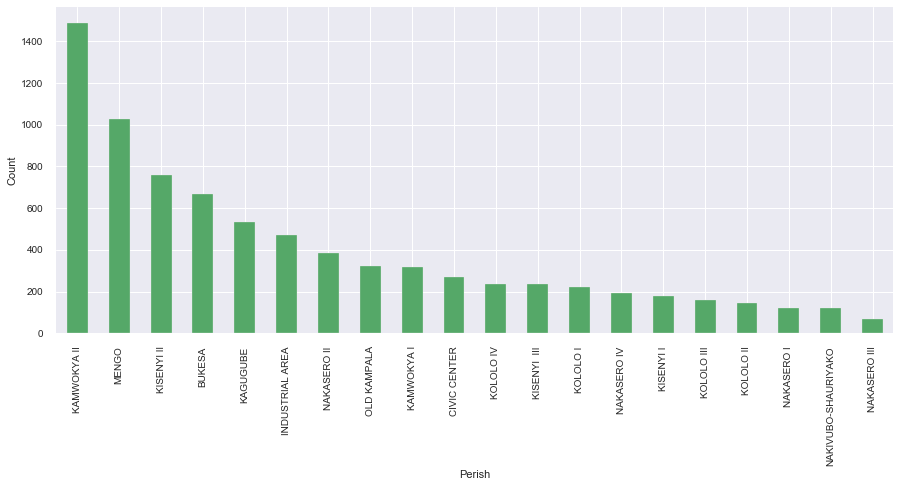

In [43]:
plt.figure(figsize = (15, 6))
prop_merge.groupby('Perish')['Property_No._'].count().sort_values(ascending=False).plot(kind='bar', color='g')
plt.ylabel('Count')


#### Observation :

      1.  KAMWOKYA II has maximum number of PRoperties

<a id=section50102></a>
### 5.1.2  Which Perish generate Highest Revenue for KCCA

Text(0, 0.5, 'Revenue')

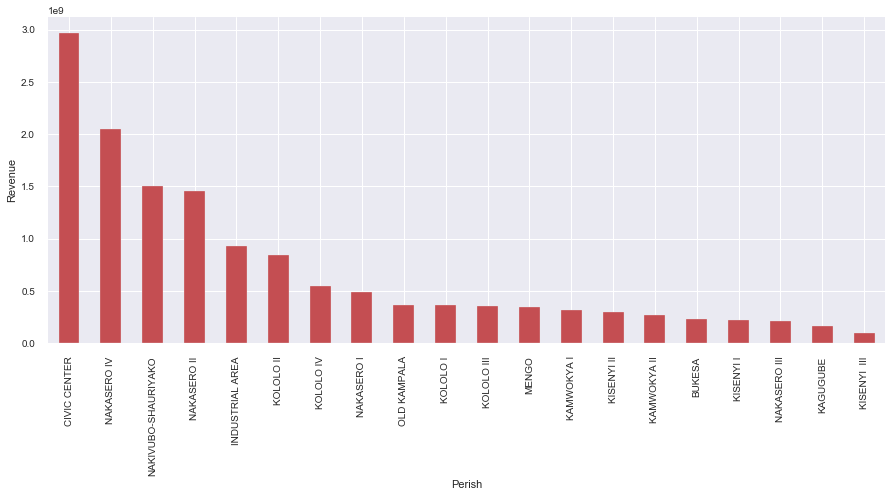

In [44]:
plt.figure(figsize = (15, 6))
prop_merge.groupby('Perish')['Property_Tax'].sum().sort_values(ascending=False).plot(kind='bar', color='r')
plt.ylabel('Revenue')

#### Observation :

  1. Civic Centre Generates Maximum Revenue for KCCA

<a id=section502></a>
### 5.2 Analysis based on Village

<a id=section50201></a>
#### 5.2.1 Which Villages has Maximum number of Properties

In [45]:
## Perish and Village wise Property Count

prop_merge.groupby(['Perish','Village'])['Village'].count()

Perish               Village                    
BUKESA               Church Zone                     93
                     Jambula Zone                    41
                     Kakajo I Zone                   89
                     Kakajo II Zone                  87
                     Katende Zone                   126
                     Kiyindi Zone                    41
                     Namalwa I Zone                 106
                     Namalwa II Zone                 72
                     Nsalo Zone                      12
CIVIC CENTER         Christ The King Zone            54
                     Neeta Zone                      44
                     Nkurumah Zone                  106
                     Radio Uganda Zone               65
INDUSTRIAL AREA      Pepsi Cola Zone                210
                     Seventh Street Zone            142
                     Sixth Street Zone              117
KAGUGUBE             Industrial Zone                112

In [46]:
prop_merge.groupby(['Perish','Village'])['Property_No._'].count().sort_values(ascending=False)[:10]

Perish           Village            
KAMWOKYA II      Kisenyi II Zone        334
                 Church Zone            278
INDUSTRIAL AREA  Pepsi Cola Zone        210
KAMWOKYA II      Kisenyi I Zone         207
KAGUGUBE         Kagugube Zone          194
KISENYI II       Kikajjo Zone           170
OLD KAMPALA      Old Kampala II Zone    153
KAMWOKYA II      Kifumbira I Zone       147
MENGO            Social Center Zone     146
KOLOLO IV        Ngabo Zone             145
Name: Property_No._, dtype: int64

Text(0, 0.5, 'Count')

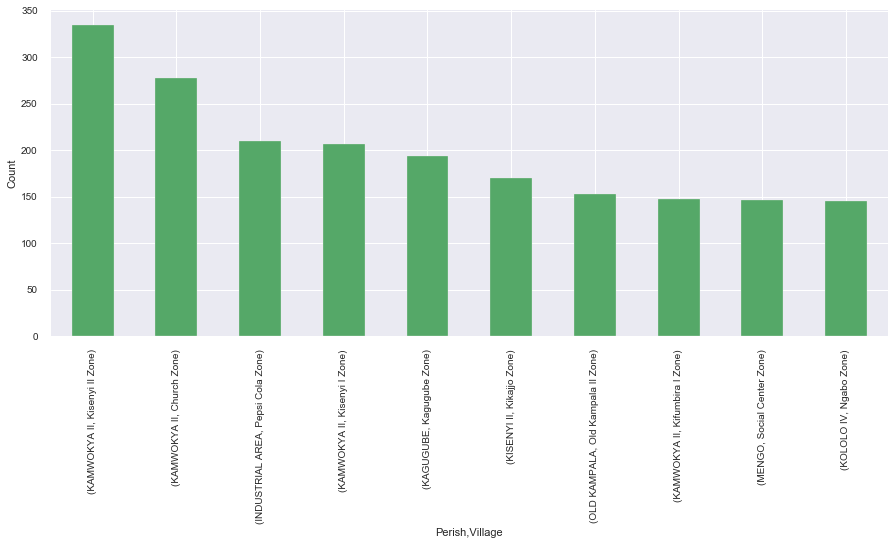

In [47]:
plt.figure(figsize = (15, 6))
prop_merge.groupby(['Perish','Village'])['Property_No._'].count().sort_values(ascending=False)[:10].plot(kind='bar', color='g')
plt.ylabel('Count')

#### Observations :
    1. Village name within Perish is repeating. Same Village name "Church Zone found in mutiple Perishes.
    2. Village Kisenyi II Zone  of KAMWOKYA II Perish ahs Maximum number of proeprties.
    3. Civic City Zone which generating Maximum Revenue for KCCA has only 3 villages and count of Properties (269) is also less as compare to other Zone

<a id=section50202></a>
#### 5.2.2  Which Village generates Maximum Revenue for KCCA

Text(0, 0.5, 'Property Tax')

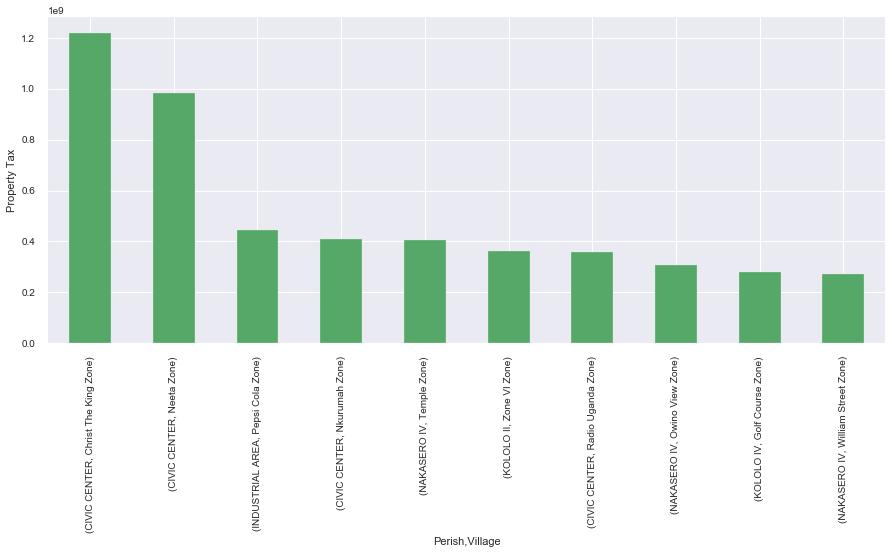

In [48]:
plt.figure(figsize = (15, 6))
prop_merge.groupby(['Perish','Village'])['Property_Tax'].sum().sort_values(ascending=False)[:10].plot(kind='bar', color='g')
plt.ylabel('Property Tax')

#### Observations :
    1. Villages from CIVIC centre genearting Maximum Revenue for KCCA.

<a id=section503></a>
### 5.3. Analysis Based on Property Usage

<a id=section50301></a>
### 5.3.1  Property Usage wise Count of Properties (Perish and Village wise)

In [49]:
prop_merge.groupby(['Perish','Village','Usage_Type'])['Property_No._'].count()

Perish               Village               Usage_Type       
BUKESA               Church Zone           COMMERCIAL           19
                                           INSTITUTIONAL        12
                                           RESIDENTIALRENTED    61
                                           SPECIAL               1
                     Jambula Zone          COMMERCIAL           10
                                           INSTITUTIONAL         2
                                           RESIDENTIALRENTED    29
                     Kakajo I Zone         COMMERCIAL           18
                                           INDUSTRIAL            3
                                           INSTITUTIONAL         6
                                           RESIDENTIALRENTED    62
                     Kakajo II Zone        COMMERCIAL           24
                                           INSTITUTIONAL         6
                                           RESIDENTIALRENTED    57
 

<a id=section50302></a>
### 5.3.2  Property Usage wise Revenue Generated for KCCA

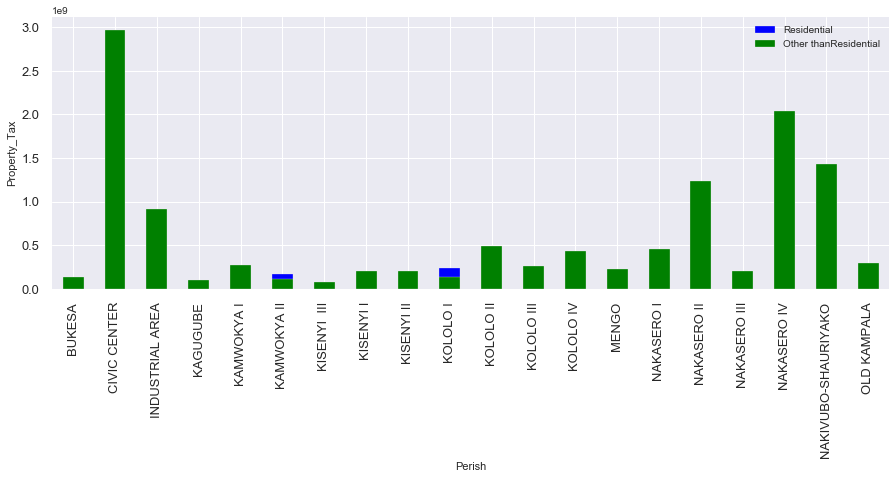

In [50]:
 plt.figure(figsize=(15,5))
 prop_merge[prop_merge['Usage_Type'] =='RESIDENTIALRENTED'].groupby(['Perish'])['Property_Tax'].sum().plot(kind='bar',color='blue',)
 prop_merge[prop_merge['Usage_Type'] !='RESIDENTIALRENTED'].groupby(['Perish'])['Property_Tax'].sum().plot(kind='bar', color='green',fontsize=13)
 plt.ylabel('Property_Tax')
 plt.legend(['Residential', 'Other thanResidential'])

####  Observation :

     1. Highest count of Properties as per data in KAMWOKYA II
     2. But Higest Revenue is from Perish "Civic Center". All Properties Under Civic Centre are of Usage Type = "Other than Residential'
     3. Other than Residential Properties generating Revenue for KCCA

<a id=section50303></a>
### 5.3.3  Top 10 combination of Perish -Village -Usage, which generates Highest Revenue for KCCA

Text(0, 0.5, 'Property Tax')

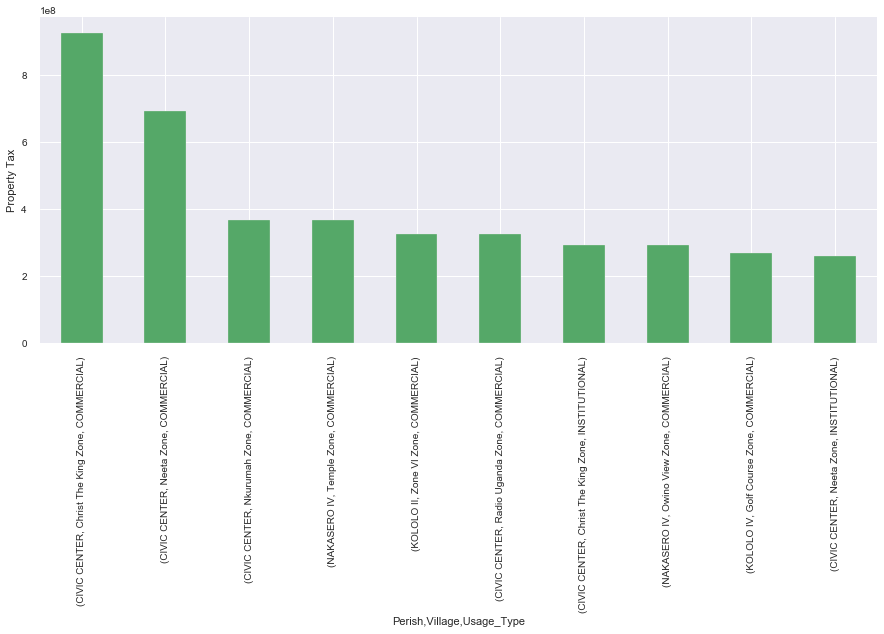

In [51]:
plt.figure(figsize = (15, 6))
prop_merge.groupby(['Perish','Village','Usage_Type'])['Property_Tax'].sum().sort_values(ascending=False)[:10].plot(kind='bar', color='g')
plt.ylabel('Property Tax')

<a id=section50304></a>
#### 5.3.4  Perish & Usage wise Property Tax

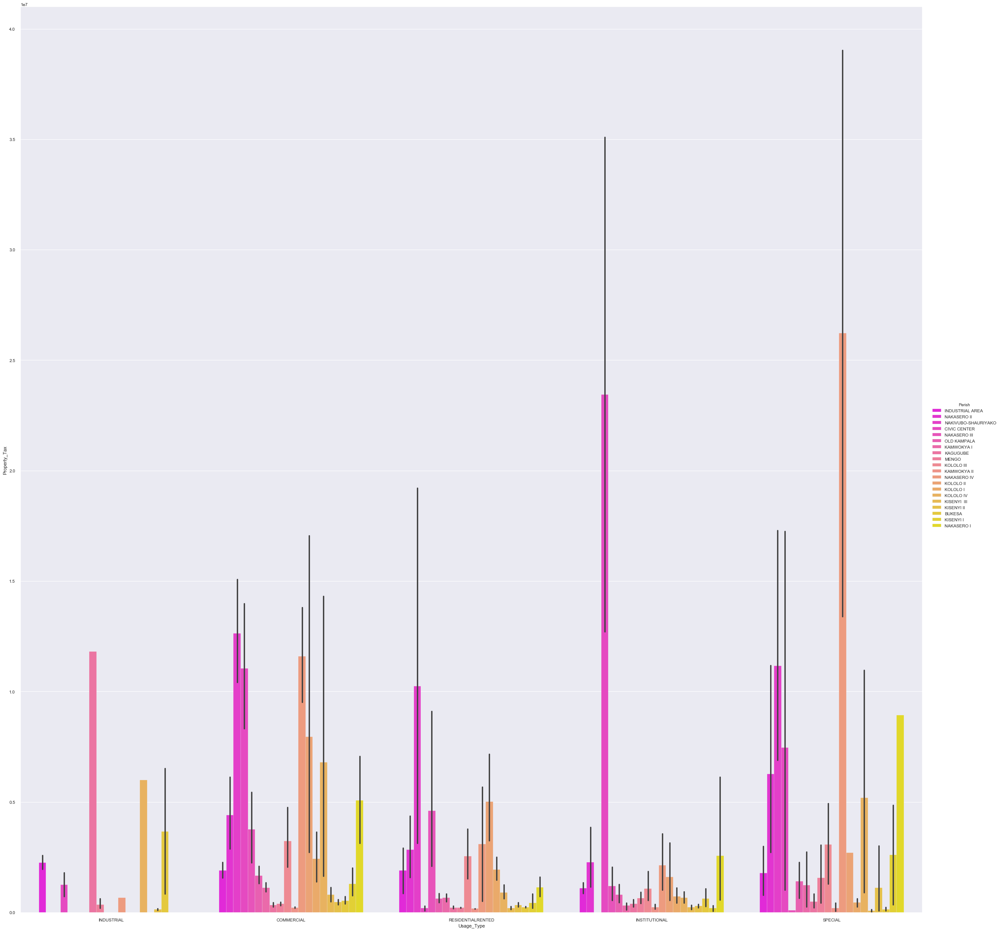

In [52]:
sns.catplot(x='Usage_Type', y='Property_Tax', hue='Perish', data=prop_merge, height=30, kind='bar', 
            palette='spring')

#### Observation :  

       1. Commercial Properties has major impact on KCCA Revenue
       2. CIVIC CNTER Perish and Christ The King Zone Village is Top to contribute Maximum Revenue with Commercial Properties
       3. Special & Institutional Proeprties also showing spike in Property Tax as compare to other Usage type.
       


<a id=section504></a>
### 5.4  Analysis of Mismatch Data

In [53]:
# checking data where Property Organisation is not NULL and usgae of Property is Residential. 
# Residential Proeprty can have Owner Names but not Organisation name

is_commercial = prop_merge[(prop_merge.Property_Org_Name.notnull()) & (prop_merge.Usage_Type == 'RESIDENTIALRENTED')]

In [54]:
is_commercial.count()                           # Count of Commerical Properties where Organisation name in data not captured

Property_No._                         503
House_No                              503
House_/_Apartment_Name                503
Street_/_Road                         503
Area_/_Locality                       503
Perish                                503
Village                               503
Property_Org_Name                     503
Contact_No                            503
COIN                                  503
Property_Address                      503
Property_Type                         503
Property_SubType                      503
Latitude                              503
Longitude                             503
Frontage                              503
Type_of_Access_(X2)                   503
Neighbourhood_Status_(X3)             503
Building_Condition_(X4)               503
Type_of_Walls_(X5)                    503
Type_of_Wall_finish_(X6)              503
Type_of_Floor_Finish_(X7)             503
Type_of_Ceiling_(X8)                  503
NWSC_Availabilty_(X9)             

In [55]:
is_commercial.head()

,Property_No._,House_No,House_/_Apartment_Name,Street_/_Road,Area_/_Locality,Perish,Village,Property_Org_Name,Contact_No,COIN,Property_Address,Property_Type,Property_SubType,Latitude,Longitude,Frontage,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Occupency_Type_,Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV,Property_Tax,Avg._Property_Rate_(per_SQM)
31,P117000205,24 WINDSOR CRESCENT,-,WINDSOR CRESCENT,WINDSOR CRESCENT,KOLOLO III,Windsor Crescent Zone,WINDSOR PROPERTIES LIMITED,722702922,12734064,24 WINDSOR CRESCENT,RESIDENTIALRENTED,Apartment,453927.0,36575.0,WINDSOR CRESCENT,Side Road,HIGH CLASS,FAIR,BRICKS,PAINTED,CERAMIC TILES,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,718.0,RESIDENTIALRENTED,Apartment,104435809.0,62661485.0,3759689,5233.0
35,P117000216,5A Kyadondo II Road,-,KYADONDO ROAD,Kyadondo II Road,KAGUGUBE,Kagugube Zone,NAKASERO PRIMARY SCHOOL,414234048,18316220,2200 KAMPALA,RESIDENTIALRENTED,Mainbuilding,451680.0,36403.0,Kyadondo II Road,Main Road,HIGH CLASS,GOOD,BRICKS,CLAY BRICKS,TERRAZZO,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,SEPTIC TANK,YES,NONE,CHAIN LINK,RENTED,220.0,RESIDENTIALRENTED,Mainbuilding,8100000.0,6318000.0,379080,1721.0
36,P117000217,5C Kyadondo II Road,-,KYADONDO ROAD,Kyadondo II Road,KAGUGUBE,Kagugube Zone,NAKASERO PRIMARY SCHOOL,414234048,18316220,2200 KAMPALA,RESIDENTIALRENTED,TenementMuzigo,451672.0,36416.0,Kyadondo II Road,Main Road,HIGH CLASS,FAIR,BRICKS,PAINTED,CEMENT SCREED,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,SEPTIC TANK,YES,NONE,CHAIN LINK,RENTED,52.0,RESIDENTIALRENTED,TenementMuzigo,3600000.0,2808000.0,168480,3266.0
37,P117000218,5B Kyadondo II Road,-,KYADONDO ROAD,Kyadondo II Road,KAGUGUBE,Kagugube Zone,NAKASERO PRIMARY SCHOOL,414234048,18316220,2200 KAMPALA,RESIDENTIALRENTED,TenementMuzigo,451685.0,36414.0,Kyadondo II Road,Main Road,HIGH CLASS,FAIR,BRICKS,PAINTED,CEMENT SCREED,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,SEPTIC TANK,YES,NONE,CHAIN LINK,RENTED,42.0,RESIDENTIALRENTED,TenementMuzigo,2700000.0,2106000.0,126360,2977.0
54,P117000260,9G2 Kisenyi II Zone,-,Unknown,Kisenyi II Zone,KAMWOKYA II,Kisenyi II Zone,ODOGOLA,772508685,12746480,9G2 Kisenyi II Zone,RESIDENTIALRENTED,Apartment,454130.0,38621.0,Kisenyi II Zone,Side Road,SLUM,FAIR,BRICKS,PAINTED,CEMENT SCREED,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,SEPTIC TANK,YES,SECURITY GUARD,WALL,RENTED,120.0,RESIDENTIALRENTED,Apartment,7650000.0,5967000.0,358020,2981.0


<a id=section50401></a>
#### 5.4.1  Perish wise count of mismatched Property Data

Text(0, 0.5, 'Count')

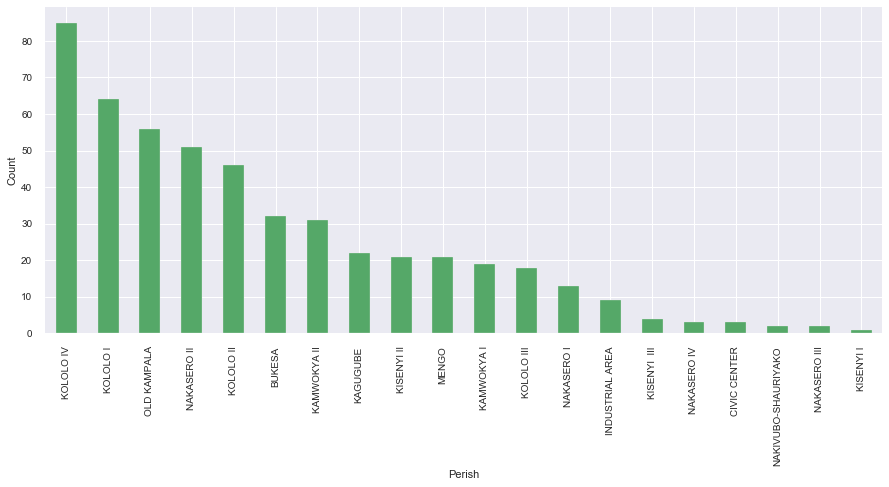

In [56]:
plt.figure(figsize = (15, 6))
is_commercial.groupby('Perish')['Property_No._'].count().sort_values(ascending=False).plot(kind='bar', color='g')
plt.ylabel('Count')

#### Observations :  
        1. There are 503 record, where Usage is residential but organisation name is mentioned. 
        2. KCCA needs to rectify such records, as if Orgnisation name is there means Proeprty usage must be other than 
            Residential OR may be usage type wrongly entered.
        3. KOLOLO IV has maximum such records.

<a id=section505></a>
#### 5.5  Analysis on the basis of Higest Property Tax

<a id=section50501></a>
#### 5.5.1  Top 10 Property Tax Payers

In [57]:
prop_merge.iloc[prop_merge['Property_Tax'].sort_values(ascending=False)[:10].index, :]

,Property_No._,House_No,House_/_Apartment_Name,Street_/_Road,Area_/_Locality,Perish,Village,Property_Org_Name,Contact_No,COIN,Property_Address,Property_Type,Property_SubType,Latitude,Longitude,Frontage,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Occupency_Type_,Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV,Property_Tax,Avg._Property_Rate_(per_SQM)
104,P117000366,2A COOPER ROAD,ACACIA MALL,COOPER ROAD,COOPER ROAD,KOLOLO II,Zone VI Zone,LEXINGTON PROPERTIES LIMITED,772744807,148174,7166 KAMPALA,COMMERCIAL,Retail_Space,453960.0,37691.0,COOPER ROAD,Main Road,MIDDLE CLASS,GOOD,METALLIC SHEETING,PAINTED,CERAMIC TILES,ACOUSTIC,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,NONE,RENTED,37123.0,COMMERCIAL,Retail_Space,5.933817e+09,4.153672e+09,249220320,6713.0
59,P117000269,1 Pilkington Road,WORKER S HOUSE,PILKINGTON ROAD,Pilkington Road,CIVIC CENTER,Neeta Zone,NATIONAL SOCIAL SECURITY FUND,417331888,18316414,7140 KAMPALA,COMMERCIAL,Office_Space,453449.0,34983.0,Pilkington Road,Main Road,HIGH CLASS,GOOD,METALLIC SHEETING,TILES,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,NONE,RENTED,22634.0,COMMERCIAL,Office_Space,4.722750e+09,3.305925e+09,198355506,8764.0
7375,P117014224,6 Yusuf Lule Road,NAKUMATT AOSIS MALL,YUSUF LULE ROAD,Yusuf Lule Road,KOLOLO IV,Golf Course Zone,NAKUMATT OASIS MALL KAMPALA,414466818,13597849,6 Yusuf Lule Road,COMMERCIAL,Retail_Space_Office_Space,454570.0,35581.0,Yusuf Lule Road,Main Road,HIGH CLASS,GOOD,METALLIC SHEETING,PAINTED,TERRAZZO,ACOUSTIC,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,26853.0,COMMERCIAL,Retail_Space_Office_Space,3.182464e+09,2.227725e+09,133663473,4978.0
5781,P117011242,33B KAMPALA ROAD,BANK OF UGANDA,KAMPALA ROAD,KAMPALA ROAD,CIVIC CENTER,Neeta Zone,BANK OF UGANDA,414258667,13439157,"7120, KAMPALA",INSTITUTIONAL,Mda,453228.0,34982.0,KAMPALA ROAD,Main Road,HIGH CLASS,GOOD,METALLIC SHEETING,PAINTED,CERAMIC TILES,ACOUSTIC,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,ELECTRIC FENCING,WALL,RENTED,11391.0,INSTITUTIONAL,Mda,3.022684e+09,2.115879e+09,126952730,11145.0
7496,P117014445,1 COLVILLE STREET,COMMUNICATIONS HOUSE,COLVILLE STREET,COLVILLE STREET,CIVIC CENTER,Christ The King Zone,UGANDA COMMUNICATIONS COMMISSION,414339000,13610847,7376 KAMPALA,COMMERCIAL,Office_Space,453660.0,34960.0,COLVILLE STREET,Main Road,HIGH CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,7005.0,COMMERCIAL,Office_Space,2.695248e+09,1.886674e+09,113200416,16160.0
6228,P117012059,4 LUMUMBA AVENUE,RWENZORI TOWERS,NAKASERO ROAD,LUMUMBA AVENUE,NAKASERO II,Water Board Zone,PINE INVESTMENTS LIMITED,414340092,5394074,37476 KAMPALA,COMMERCIAL,Office_Space,453179.0,35357.0,LUMUMBA AVENUE,Main Road,HIGH CLASS,GOOD,METALLIC SHEETING,PAINTED,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,16989.0,COMMERCIAL,Office_Space,2.637025e+09,1.845917e+09,110755040,6519.0
2983,P117005985,4 APOLLO KAGWA ROAD,AUDIT HOUSE,Unknown,APOLLO KAGWA ROAD,CIVIC CENTER,Christ The King Zone,OFFICE OF THE AUDITOR GENERAL,793344604,12938831,7083 KAMPALA,COMMERCIAL,Office_Space,453760.0,35205.0,APOLLO KAGWA ROAD,Main Road,HIGH CLASS,GOOD,BRICKS,ROUGH CAST,CERAMIC TILES,ACOUSTIC,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,16300.0,COMMERCIAL,Office_Space,2.615933e+09,1.831153e+09,109869178,6740.0
7891,P117015095,10 MARKET STREET,ENERGY CENTRE,MARKET STREET,MARKET STREET,NAKASERO IV,Temple Zone,DL PROPERTIES LIMITED,780503557,13680881,2839 KAMPALA,COMMERCIAL,Retail_Space,453000.0,34740.0,MARKET STREET,Main Road,HIGH CLASS,GOOD,METALLIC SHEETING,PAINTED,CERAMIC TILES,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUAR

<a id=section50502></a>
#### 5.5.2   Perish wise Revenue from Top 10 Properties

Text(0, 0.5, 'Property Tax')

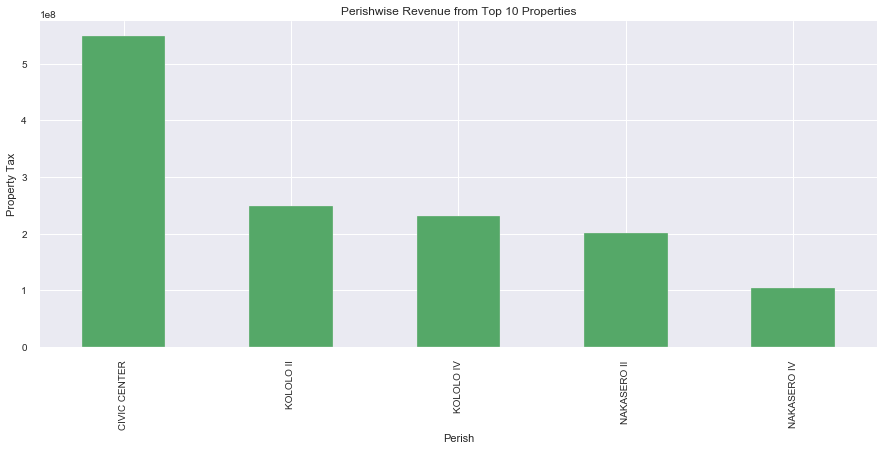

In [58]:
higest_taxpayer = prop_merge.iloc[prop_merge['Property_Tax'].sort_values(ascending=False)[:10].index, :]
plt.figure(figsize = (15, 6))
higest_taxpayer.groupby('Perish')['Property_Tax'].sum().sort_values(ascending=False).plot(kind='bar', color='g')
plt.title("Perishwise Revenue from Top 10 Properties")
plt.ylabel("Property Tax")

In [59]:
print(higest_taxpayer.groupby('Perish')['Property_Tax'].sum())

Perish
CIVIC CENTER    548377830
KOLOLO II       249220320
KOLOLO IV       231109599
NAKASERO II     200648508
NAKASERO IV     105000000
Name: Property_Tax, dtype: int32


<a id=section50503></a>
#### 5.5.3  Usage wise Revenue from Top 10 Properties 

Text(0, 0.5, 'Property Tax')

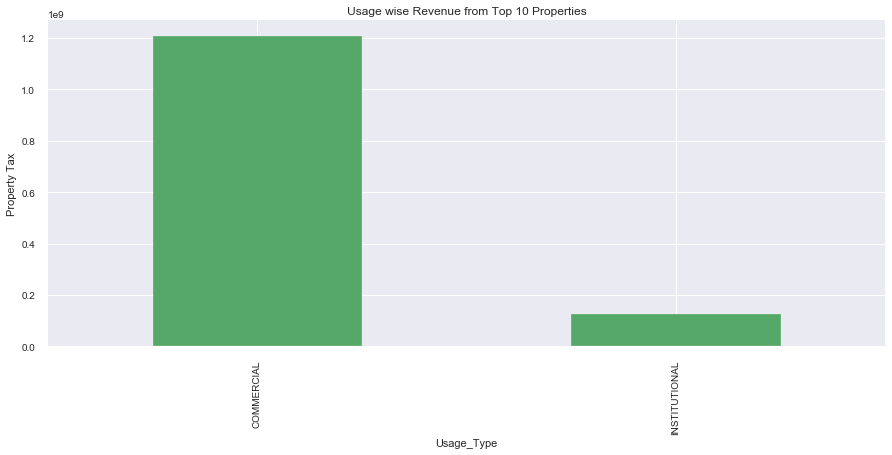

In [60]:
higest_taxpayer = prop_merge.iloc[prop_merge['Property_Tax'].sort_values(ascending=False)[:10].index, :]
plt.figure(figsize = (15, 6))
higest_taxpayer.groupby('Usage_Type')['Property_Tax'].sum().sort_values(ascending=False).plot(kind='bar', color='g')
plt.title("Usage wise Revenue from Top 10 Properties")
plt.ylabel("Property Tax")

<a id=section50504></a>
#### 5.5.4  Analyis of Top 10 Properties on the basis of Carpet Area of Property

Text(0, 0.5, 'Property Tax')

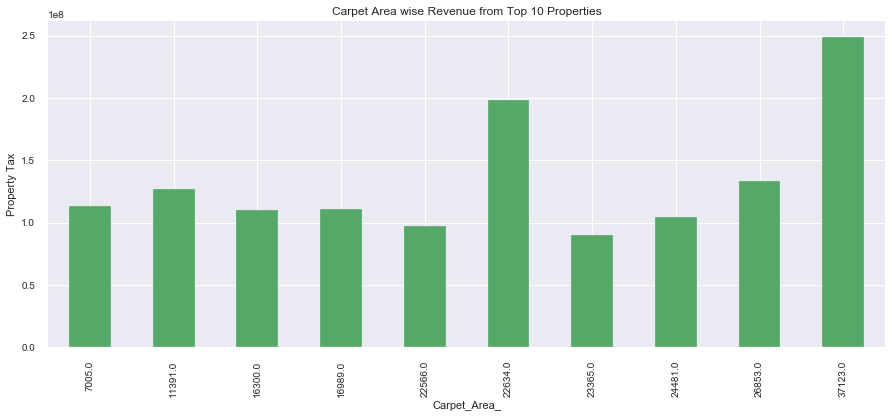

In [61]:
higest_taxpayer_carpetarea = prop_merge.iloc[higest_taxpayer['Carpet_Area_'].sort_values(ascending=False)[:10].index, :]
plt.figure(figsize = (15, 6))
higest_taxpayer.groupby('Carpet_Area_')['Property_Tax'].sum().plot(kind='bar', color='g')
plt.title("Carpet Area wise Revenue from Top 10 Properties")
plt.ylabel("Property Tax")

In [62]:
higest_taxpayer_carpetarea.loc[:,['Carpet_Area_', 'Perish','Usage_Type','Avg._Property_Rate_(per_SQM)']]

,Carpet_Area_,Perish,Usage_Type,Avg._Property_Rate_(per_SQM)
104,37123.0,KOLOLO II,COMMERCIAL,6713.0
7375,26853.0,KOLOLO IV,COMMERCIAL,4978.0
7891,24481.0,NAKASERO IV,COMMERCIAL,4289.0
2,23365.0,NAKASERO II,COMMERCIAL,3847.0
59,22634.0,CIVIC CENTER,COMMERCIAL,8764.0
7376,22566.0,KOLOLO IV,COMMERCIAL,4318.0
6228,16989.0,NAKASERO II,COMMERCIAL,6519.0
2983,16300.0,CIVIC CENTER,COMMERCIAL,6740.0
5781,11391.0,CIVIC CENTER,INSTITUTIONAL,11145.0
7496,7005.0,CIVIC CENTER,COMMERCIAL,16160.0


In [63]:
higest_taxpayer_carpetarea[higest_taxpayer_carpetarea['Property_No._'].isin(["P117014445","P117005985"])]

,Property_No._,House_No,House_/_Apartment_Name,Street_/_Road,Area_/_Locality,Perish,Village,Property_Org_Name,Contact_No,COIN,Property_Address,Property_Type,Property_SubType,Latitude,Longitude,Frontage,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Occupency_Type_,Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV,Property_Tax,Avg._Property_Rate_(per_SQM)
2983,P117005985,4 APOLLO KAGWA ROAD,AUDIT HOUSE,Unknown,APOLLO KAGWA ROAD,CIVIC CENTER,Christ The King Zone,OFFICE OF THE AUDITOR GENERAL,793344604,12938831,7083 KAMPALA,COMMERCIAL,Office_Space,453760.0,35205.0,APOLLO KAGWA ROAD,Main Road,HIGH CLASS,GOOD,BRICKS,ROUGH CAST,CERAMIC TILES,ACOUSTIC,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,16300.0,COMMERCIAL,Office_Space,2.615933e+09,1.831153e+09,109869178,6740.0
7496,P117014445,1 COLVILLE STREET,COMMUNICATIONS HOUSE,COLVILLE STREET,COLVILLE STREET,CIVIC CENTER,Christ The King Zone,UGANDA COMMUNICATIONS COMMISSION,414339000,13610847,7376 KAMPALA,COMMERCIAL,Office_Space,453660.0,34960.0,COLVILLE STREET,Main Road,HIGH CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,7005.0,COMMERCIAL,Office_Space,2.695248e+09,1.886674e+09,113200416,16160.0


#### Observations :
    1.  Highest Tax payer are from Perish Civic Center with total tax = 548377830 UGX
    2.  Higest Tax Payer are  of Usage type = Commerical and Institutional only. Mainly Commercial properties are paying 
        higest tax
    3.  Within Highest tax Payer, proeprty with less carpet area paying more than property with more carpet area, even though property is of same Usage type(Commercial) and in the same area (Perish = Civic Center)
    4.  Property rate per Square meter is more, almost double, even though having carpet area less.
            Carpet_Area_        Perish     Usage_Type  Avg._Property_Rate_(per_SQM)          Property_No._
            16300.0         CIVIC CENTER     COMMERCIAL                        6740.0        P117014445
            7005.0          CIVIC CENTER     COMMERCIAL                       16160.0        P117005985
            
       May be some other factor affecting the valuation process. Let's see What are the other factors, are they varying/ different for this properties. 
            
   5. futher it is observed that only Tyoe of wall - finish, Type of Ceiling are different beside Carpet Area. 
   
   RV is likely impacting due to Type of wall finish, type of ceiling, because of these factors RV is high eventhough Carpet Area is less.

<a id=section506></a>
#### 5.6  Analysis of Property Valuation on the basis of various Factors of Properties

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]), <a list of 20 Text xticklabel objects>)

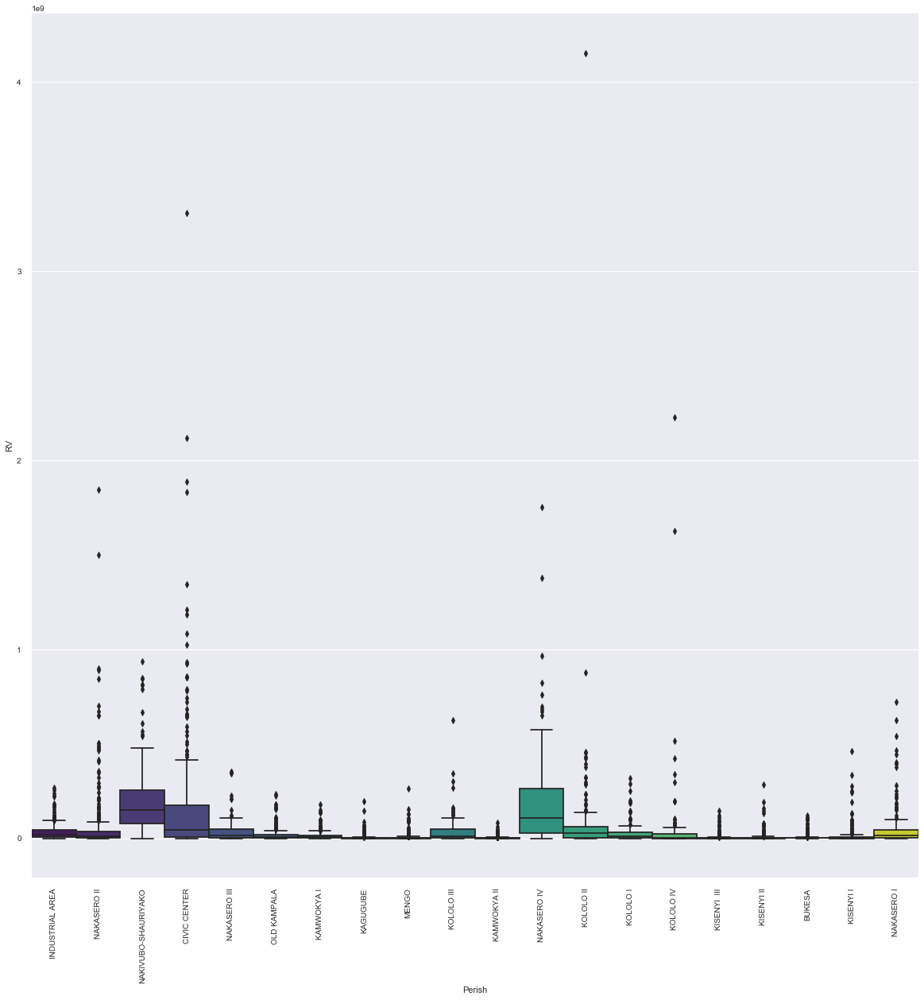

In [64]:
plt.figure(figsize=(20, 20))
sns.boxplot(data=prop_merge, x='Perish', y='RV', palette='viridis', width=1.0)
plt.xticks(rotation=90)

#### Observations :
1. Alsmost all Perishes have Outliners 
2. KCCA need to work on Property Valuation method, many properties are outliners.

In [65]:
factor_info =['Type_of_Access_(X2)','Neighbourhood_Status_(X3)','Building_Condition_(X4)','Type_of_Walls_(X5)','Type_of_Wall_finish_(X6)','Type_of_Floor_Finish_(X7)','Type_of_Ceiling_(X8)','NWSC_Availabilty_(X9)','Hydro_Power_Availabilty_(X10)','Type_of_Saniation_Facility_(X11)','Availabilty_of_Parking_Space_(X12)','Type_of_Security_(X13)','Type_of_Boundary_Wall_(X14)'
]

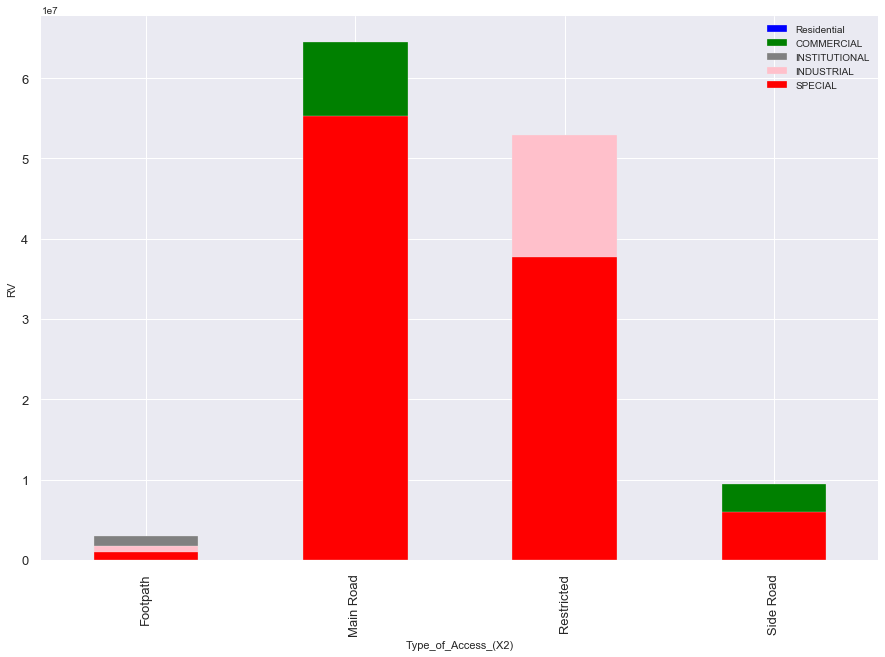

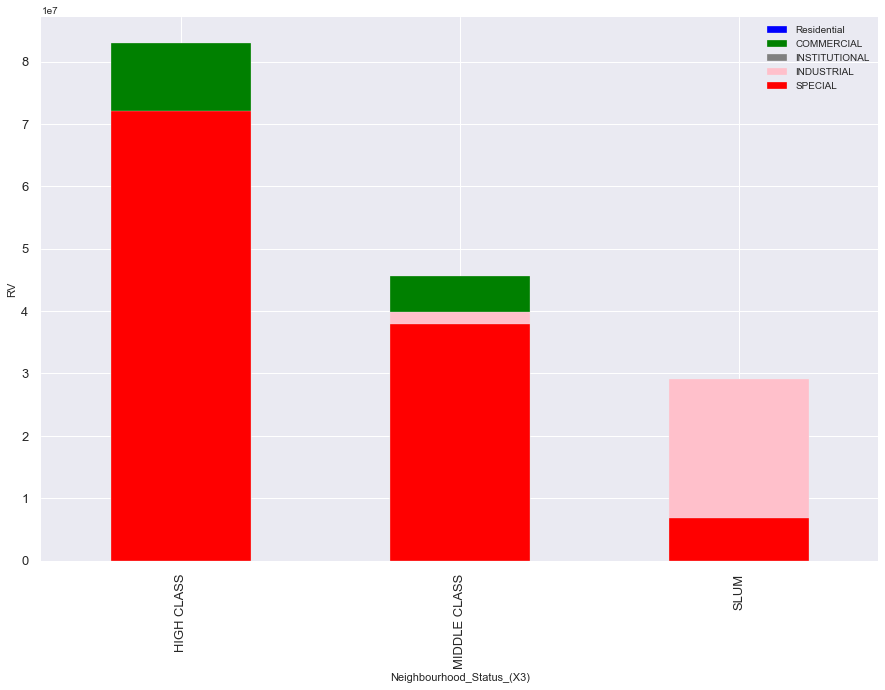

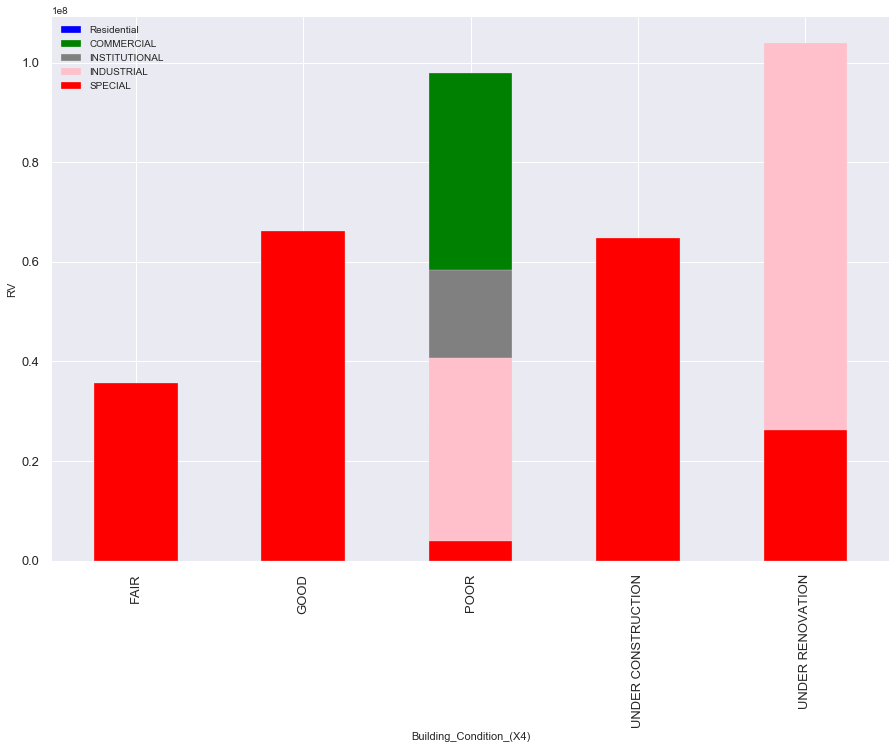

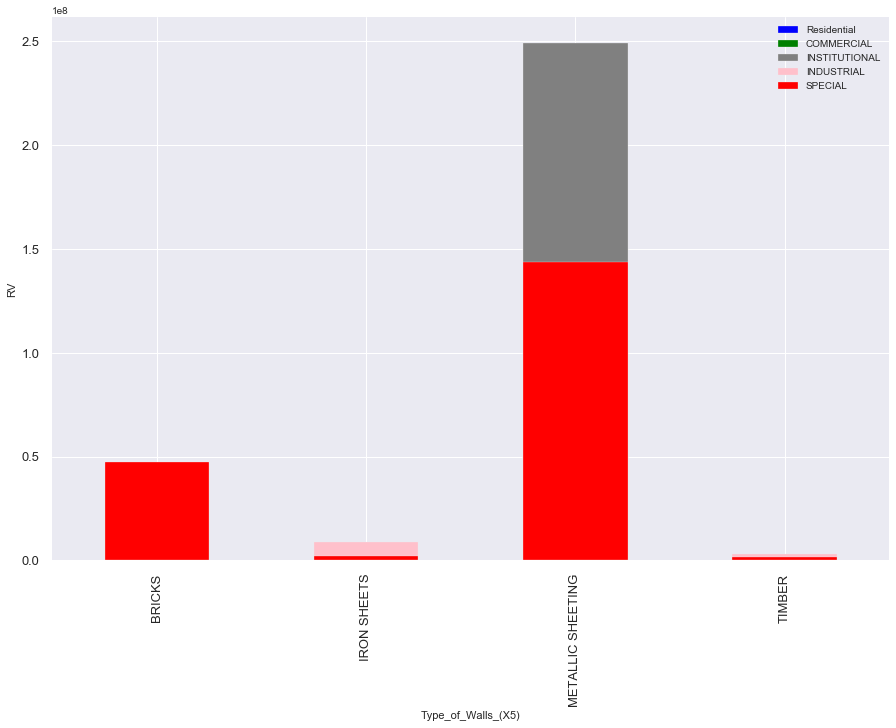

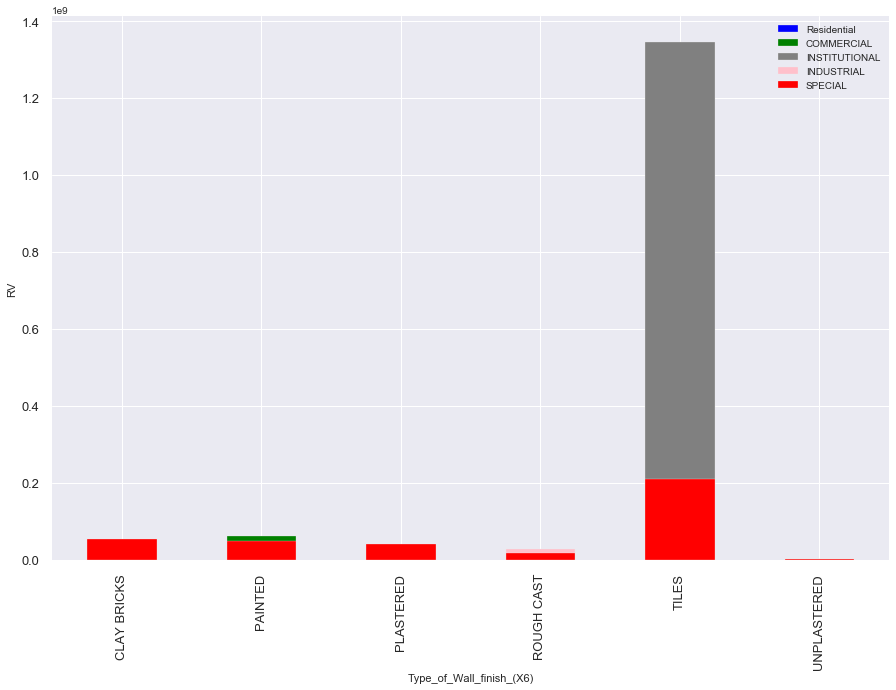

...

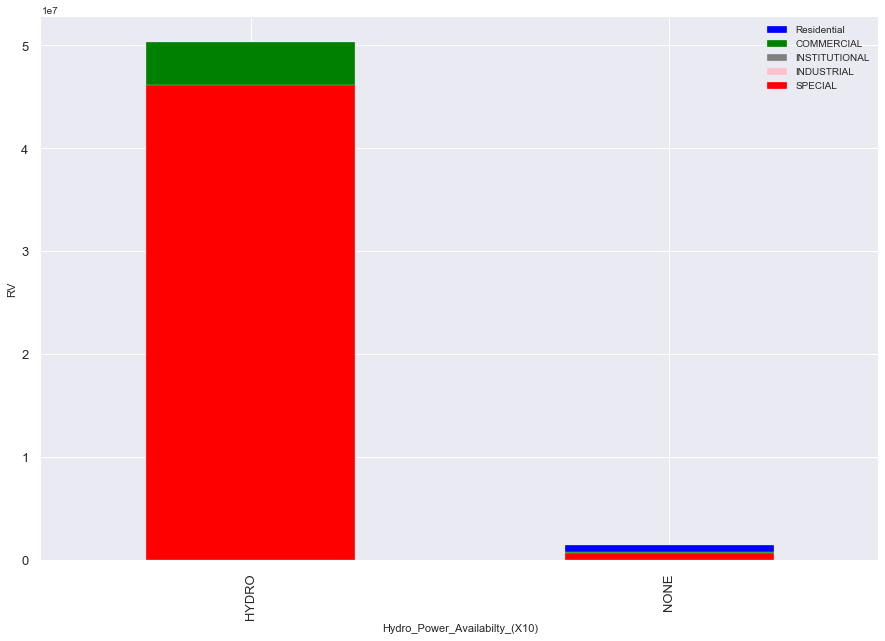

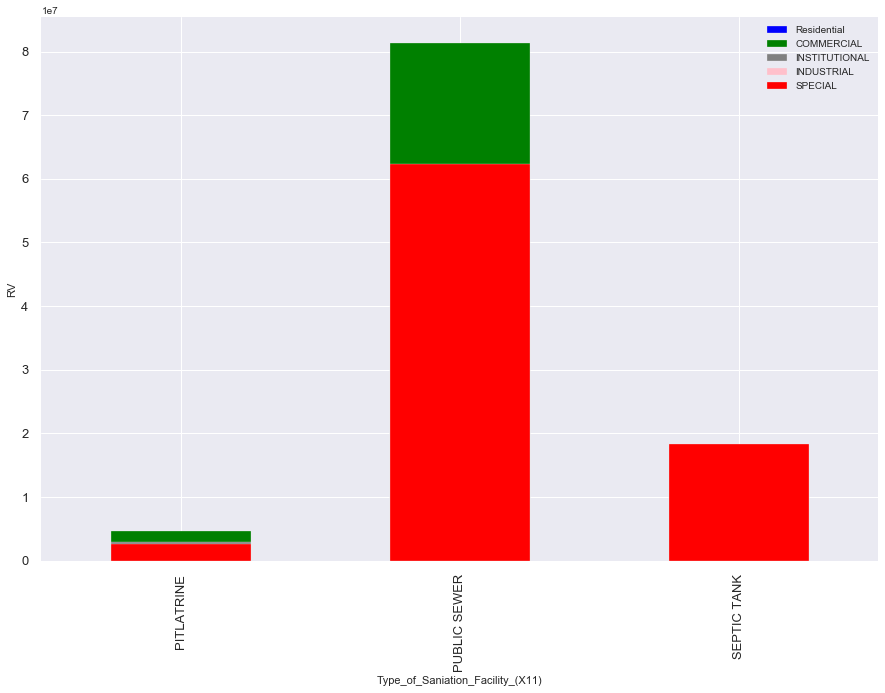

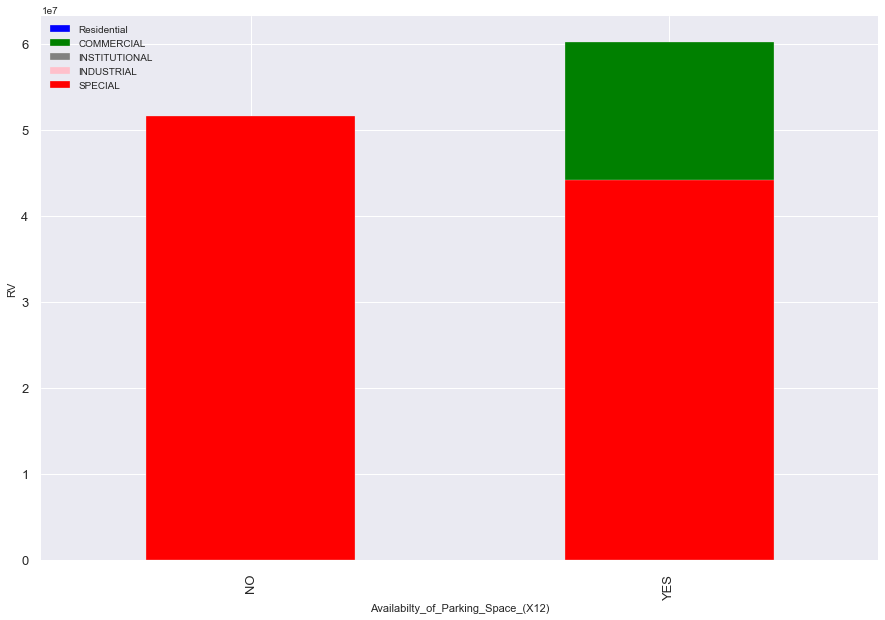

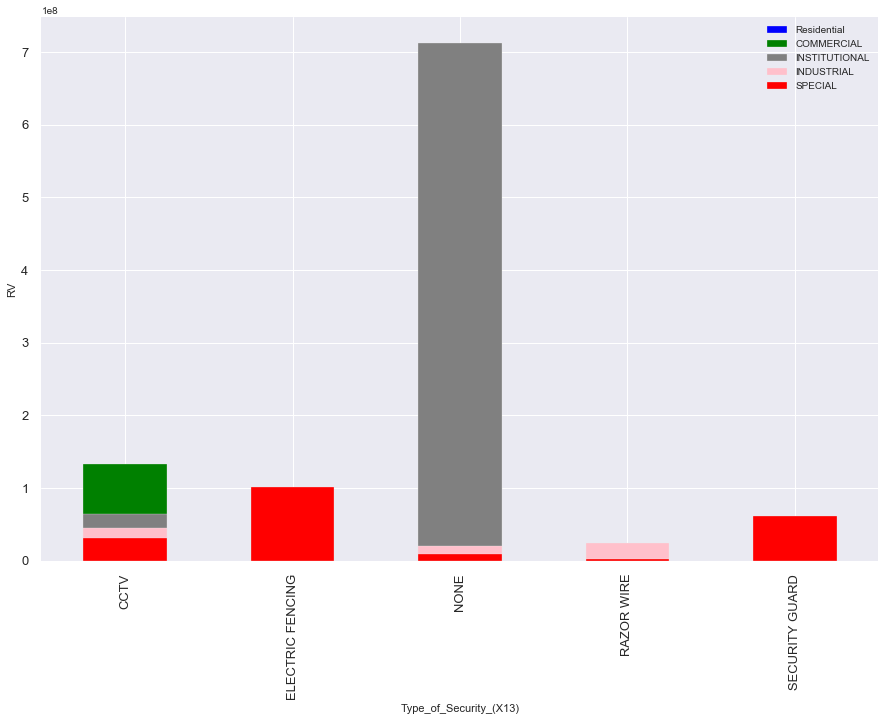

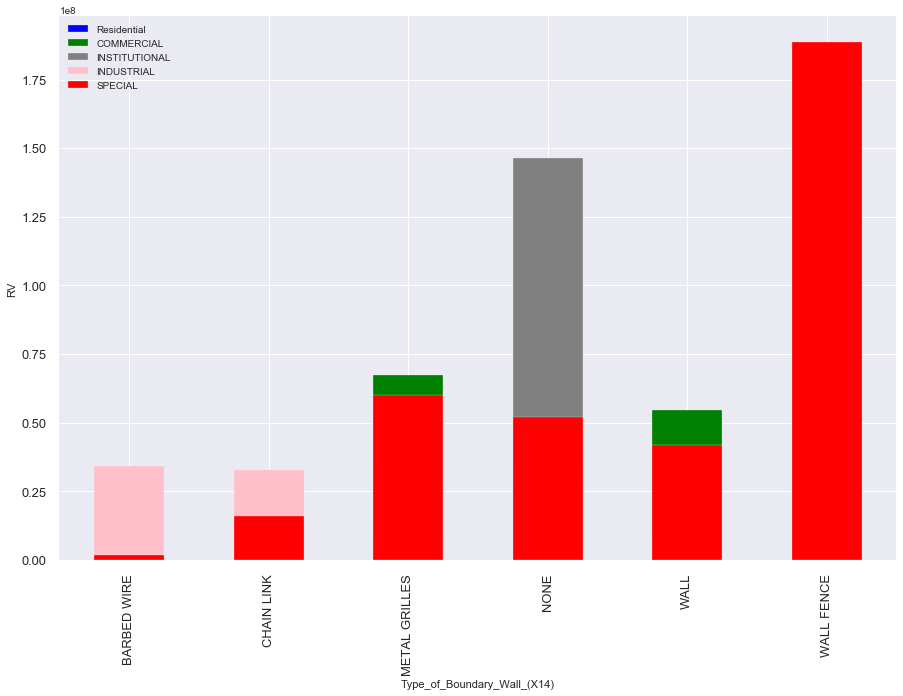

In [66]:
for value in factor_info:
    plt.figure(figsize=(15,10))
    prop_merge[prop_merge['Usage_Type'] =='RESIDENTIALRENTED'].groupby([value])['RV'].mean().plot(kind='bar',
    color='blue',fontsize =13 ,)
    prop_merge[prop_merge['Usage_Type'] =='COMMERCIAL'].groupby([value])['RV'].mean().plot(kind='bar', color='green',fontsize=13,)
    prop_merge[prop_merge['Usage_Type'] =='INSTITUTIONAL'].groupby([value])['RV'].mean().plot(kind='bar', color='grey',fontsize=13,)
    prop_merge[prop_merge['Usage_Type'] =='INDUSTRIAL'].groupby([value])['RV'].mean().plot(kind='bar', color='pink',fontsize=13,)
    prop_merge[prop_merge['Usage_Type'] =='SPECIAL'].groupby([value])['RV'].mean().plot(kind='bar', color='red',fontsize=13,)
    plt.ylabel('RV')
    plt.xlabel(value)
    plt.legend(['Residential', 'COMMERCIAL','INSTITUTIONAL','INDUSTRIAL', 'SPECIAL'])

#### Observations

   1. In Central Division, Majority Properties are Non-Residential (Other than Residential)
   2. Vauation of property as per data depend on various above factors
   

In [67]:
prop_new = prop_merge.copy(deep=True)         # Creating New dataframe for correlation analysis, as need to drop few fields

In [68]:
prop_new.head()

,Property_No._,House_No,House_/_Apartment_Name,Street_/_Road,Area_/_Locality,Perish,Village,Property_Org_Name,Contact_No,COIN,Property_Address,Property_Type,Property_SubType,Latitude,Longitude,Frontage,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Occupency_Type_,Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV,Property_Tax,Avg._Property_Rate_(per_SQM)
0,P117000004,61A SIXTH STREET,STAUNCH GENERATORS,SIXTH STREET,SIXTH STREET,INDUSTRIAL AREA,Sixth Street Zone,NADIM'S LTD,752251144,12877721,1707 KAMPALA,INDUSTRIAL,Showroom,455923.0,35302.0,SIXTH STREET,Main Road,HIGH CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,GYPSUM,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,CCTV,WALL,RENTED,373.0,INDUSTRIAL,Showroom,1.643323e+07,1.150326e+07,690196,1851.0
1,P117000005,2A Nakasero Lane,D MELLOS BAR AND RESTAURANT,NAKASERO LANE,Nakasero Lane,NAKASERO II,Flats Villages Zone,NAKASERO CLUB LIMITED,772736444,12942420,3446 KAMPALA,COMMERCIAL,Restaurant,452740.0,35770.0,Nakasero Lane,Main Road,HIGH CLASS,FAIR,METALLIC SHEETING,PAINTED,CERAMIC TILES,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,WALL,RENTED,251.0,COMMERCIAL,Restaurant,2.527914e+07,1.769540e+07,1061724,4230.0
2,P117000006,13 BUGANDA ROAD,SENANA HYPERMARKET,BUGANDA ROAD,BUGANDA ROAD,NAKASERO II,Flats Villages Zone,FARIDA NABIRONGO c/o SENANA SHOPING CENTRE,702658026,13335561,13 BUGANDA ROAD,COMMERCIAL,Retail_Space,452683.0,35578.0,BUGANDA ROAD,Main Road,MIDDLE CLASS,GOOD,BRICKS,PAINTED,CERAMIC TILES,PLASTERED PAINTED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,NONE,NONE,RENTED,23365.0,COMMERCIAL,Retail_Space,2.140321e+09,1.498224e+09,89893468,3847.0
3,P117000162,29 WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,772748379,18317287,"12016, KAMPALA",COMMERCIAL,Retail_Space_Rear_Room,452532.0,35319.0,WILLIAM STREET,Main Road,HIGH CLASS,POOR,BRICKS,PAINTED,CEMENT SCREED,SOFT BOARD,NWSC SUPPLY,HYDRO,PUBLIC SEWER,NO,SECURITY GUARD,NONE,RENTED,737.0,COMMERCIAL,Retail_Space_Rear_Room,7.577539e+07,5.304277e+07,3182566,4318.0
4,P117000164,33A WILLIAM STREET,-,WILLIAM STREET,WILLIAM STREET,NAKIVUBO-SHAURIYAKO,Remand B Zone,MARIANA AGENCIES LIMITED,772748379,18317287,"12016, KAMPALA",COMMERCIAL,Retail_Space_Office_Space,452496.0,35372.0,WILLIAM STREET,Main Road,HIGH CLASS,FAIR,BRICKS,PLASTERED,CEMENT SCREED,PLASTERED,NWSC SUPPLY,HYDRO,PUBLIC SEWER,YES,SECURITY GUARD,NONE,RENTED,833.0,COMMERCIAL,Retail_Space_Office_Space,1.509816e+08,1.056871e+08,6341228,7613.0


In [69]:
prop_new.drop(['House_No', 'House_/_Apartment_Name', 'Street_/_Road','Area_/_Locality','Property_Org_Name', 'Contact_No', 'COIN','Property_Address','Latitude','Longitude','Frontage','Property_Tax','Avg._Property_Rate_(per_SQM)'], 1, inplace=True)

In [70]:
prop_new.drop(['Property_Tax','Avg._Property_Rate_(per_SQM)'], 1, inplace=True)

KeyError: "['Property_Tax' 'Avg._Property_Rate_(per_SQM)'] not found in axis"

In [99]:
prop_new.drop(['Property_Type','Property_SubType','Occupency_Type_'], 1, inplace=True)

KeyError: "['Property_Type' 'Property_SubType'] not found in axis"

In [101]:
prop_new.drop(['Occupency_Type_'], 1, inplace=True)

In [102]:
prop_new.head()

,Property_No._,Perish,Village,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV
0,0,4,84,1,0,2,0,1,1,1,1,0,1,0,0,6,240,1,27,2243,253
1,1,17,61,1,0,1,2,1,1,6,1,0,1,1,5,6,1368,0,22,2636,2388
2,128,17,61,1,1,2,0,1,1,4,1,0,1,1,3,4,1308,0,24,2985,2061
3,1362,2,23,1,0,3,0,1,0,6,1,0,1,0,5,4,626,0,26,1311,699
4,2596,2,23,1,0,1,0,2,0,3,1,0,1,1,5,4,711,0,25,2078,2360


In [103]:
from sklearn.preprocessing import LabelEncoder                                    # Label encoder is used to transform non-numerical labels to numerical labels.
number = LabelEncoder()                                                           # Here as our data set consists only of categorical values except age
for i in prop_new.columns:                                                          # in order to find the correlation between variables, we do Label encoding 
    prop_new[i] = number.fit_transform(prop_new[i].astype('str'))

In [104]:
corr=prop_new.corr()['RV']
corr[np.argsort(corr,axis=0)[::-1]]

RV                                    1.000000
Carpet_Area_                          0.072595
Usage_Type                            0.055285
Usage_SubType                         0.048964
Neighbourhood_Status_(X3)             0.036946
Village                               0.033394
Type_of_Access_(X2)                   0.022429
Type_of_Wall_finish_(X6)              0.015426
Type_of_Ceiling_(X8)                  0.011441
ALV                                   0.011227
Type_of_Boundary_Wall_(X14)           0.010313
Hydro_Power_Availabilty_(X10)         0.000868
Building_Condition_(X4)              -0.005147
Property_No._                        -0.009430
NWSC_Availabilty_(X9)                -0.011612
Perish                               -0.014347
Type_of_Walls_(X5)                   -0.014457
Availabilty_of_Parking_Space_(X12)   -0.017993
Type_of_Saniation_Facility_(X11)     -0.018695
Type_of_Floor_Finish_(X7)            -0.020675
Type_of_Security_(X13)               -0.021531
Name: RV, dty

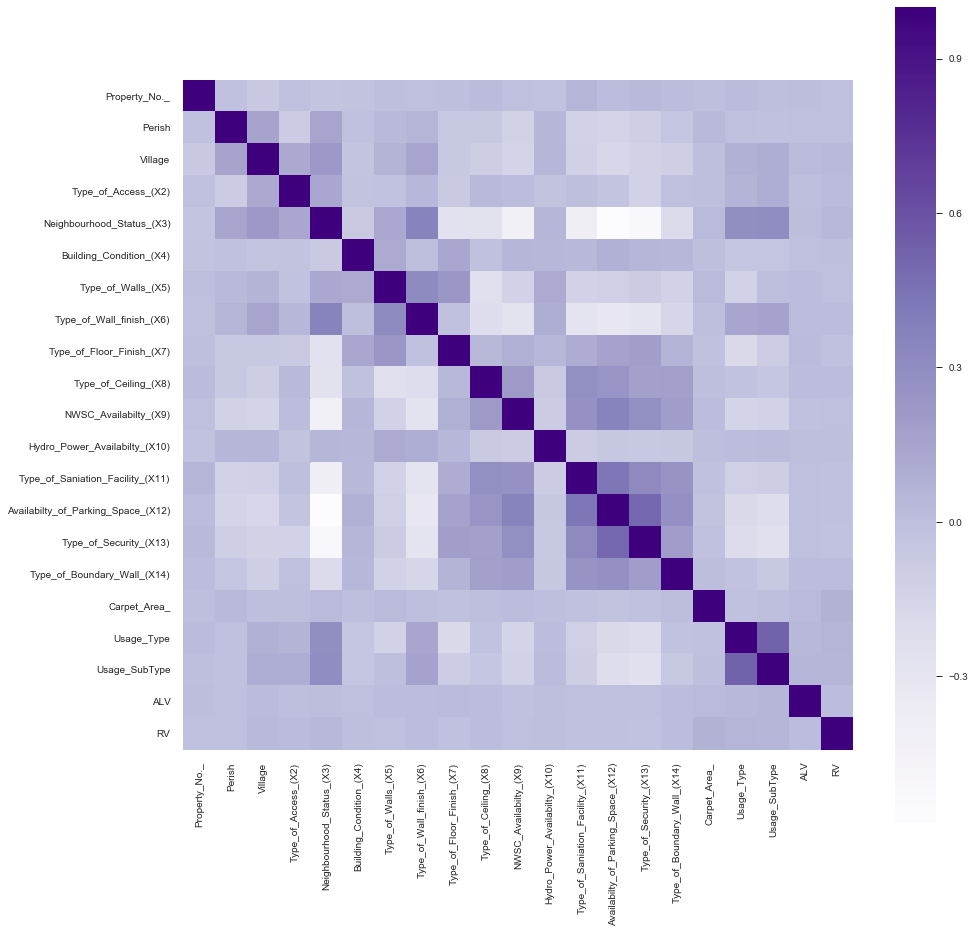

In [106]:
features_correlation = prop_new.corr()
plt.figure(figsize=(15,15))
sns.heatmap(features_correlation,vmax=1,square=True,annot=False,cmap='Purples')
plt.show()

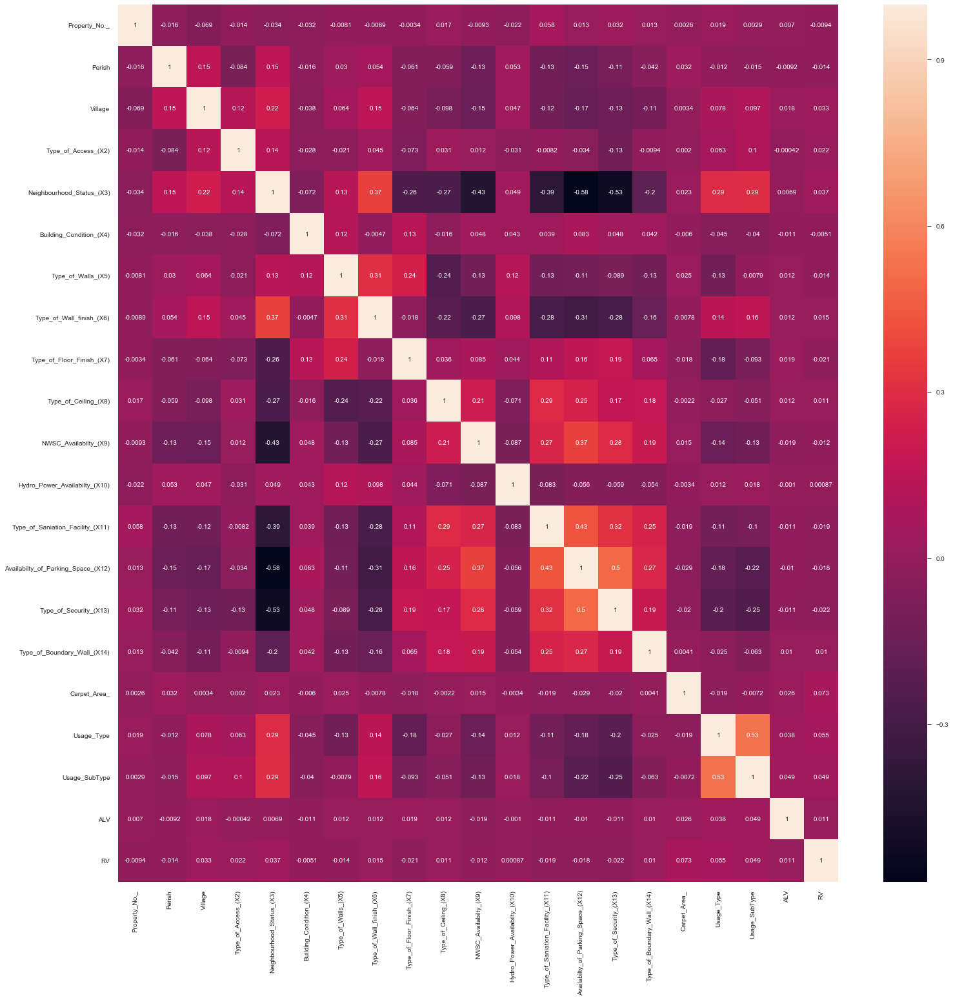

In [110]:
plt.figure(figsize=(25,25))
sns.heatmap( prop_new.corr(), annot=True );
plt.show()

In [107]:
prop_new.corr()

,Property_No._,Perish,Village,Type_of_Access_(X2),Neighbourhood_Status_(X3),Building_Condition_(X4),Type_of_Walls_(X5),Type_of_Wall_finish_(X6),Type_of_Floor_Finish_(X7),Type_of_Ceiling_(X8),NWSC_Availabilty_(X9),Hydro_Power_Availabilty_(X10),Type_of_Saniation_Facility_(X11),Availabilty_of_Parking_Space_(X12),Type_of_Security_(X13),Type_of_Boundary_Wall_(X14),Carpet_Area_,Usage_Type,Usage_SubType,ALV,RV
Property_No._,1.000000,-0.015936,-0.068663,-0.014120,-0.034396,-0.032229,-0.008053,-0.008886,-0.003433,0.017230,-0.009264,-0.021629,0.058146,0.012580,0.032483,0.013109,0.002584,0.019492,0.002891,0.007013,-0.009430
Perish,-0.015936,1.000000,0.153598,-0.083978,0.146244,-0.016431,0.029997,0.053587,-0.060529,-0.058940,-0.132296,0.052651,-0.126268,-0.146185,-0.105894,-0.041902,0.032154,-0.011788,-0.014726,-0.009163,-0.014347
Village,-0.068663,0.153598,1.000000,0.122267,0.222034,-0.038428,0.064299,0.147366,-0.063799,-0.098113,-0.149504,0.047321,-0.123107,-0.169041,-0.133214,-0.108915,0.003357,0.078433,0.097177,0.018423,0.033394
Type_of_Access_(X2),-0.014120,-0.083978,0.122267,1.000000,0.139891,-0.027803,-0.021417,0.045238,-0.073352,0.031219,0.011650,-0.031307,-0.008164,-0.033511,-0.127506,-0.009396,0.001954,0.062753,0.099817,-0.000415,0.022429
Neighbourhood_Status_(X3),-0.034396,0.146244,0.222034,0.139891,1.000000,-0.071782,0.129418,0.365359,-0.257561,-0.266024,-0.429238,0.049361,-0.392916,-0.583814,-0.527411,-0.200035,0.023408,0.290823,0.294796,0.006945,0.036946
Building_Condition_(X4),-0.032229,-0.016431,-0.038428,-0.027803,-0.071782,1.000000,0.116992,-0.004664,0.134706,-0.015781,0.047518,0.043295,0.038558,0.082767,0.047888,0.042248,-0.005987,-0.044963,-0.040380,-0.010900,-0.005147
Type_of_Walls_(X5),-0.008053,0.029997,0.064299,-0.021417,0.129418,0.116992,1.000000,0.311437,0.239010,-0.238889,-0.128160,0.119661,-0.132001,-0.114565,-0.088730,-0.131925,0.025442,-0.130702,-0.007894,0.011830,-0.014457
Type_of_Wall_finish_(X6),-0.008886,0.053587,0.147366,0.045238,0.365359,-0.004664,0.311437,1.000000,-0.017576,-0.222036,-0.271306,0.097623,-0.276220,-0.308994,-0.284097,-0.159813,-0.007791,0.143548,0.162454,0.012486,0.015426
Type_of_Floor_Finish_(X7),-0.003433,-0.060529,-0.063799,-0.073352,-0.257561,0.134706,0.239010,-0.017576,1.000000,0.036231,0.084877,0.044434,0.107287,0.163817,0.187503,0.064651,-0.018009,-0.180682,-0.093358,0.018649,-0.020675
Type_of_Ceiling_(X8),0.017230,-0.058940,-0.098113,0.031219,-0.266024,-0.015781,-0.238889,-0.222036,0.036231,1.000000,0.210467,-0.070805,0.285946,0.250513,0.173965,0.180054,-0.002160,-0.026820,-0.050866,0.011865,0.011441


#### Observations :
1.  ALV and RV expected highly correlated as per domain as RV is depend on ALV. But data shows that low Correleation
2.  Valuation (ALV and RV) are supposed to calculate based on reamining Factors mentioned. Butit clearly stating that factors not impacting valuation strongly.
3. Many Factors showing -ve Correlation 

<a id=section6></a>
## 6. Conclusions
       1. Survey data of Central Division has given detailed about property valuation
       2. Data has disparity, Logical mismatch in Data Observed which impacting Valuation of Data
       3. Valuation RV as compare to various Factors is not correlated
       4. Many Factors considered for Valuation showing -ve Correlation 
      

<a id=section601></a>
### 6.1  Actionable Insights

       1. In Order to increase the Revenue of KCCA,they need to cross check the data with factors collected properly.
       2. KCCA need to check the Factors considered for Valuation, as many showing -ve Correlation between each other
       2. Need to standardise the Valuation formula based on Various factors of Properties